# Quantifying semisc similarity
## Chapter X: Data sequence analysis patches 

### Author: Anders Kampenes

### Dimension reduction and visualization with PCA

In [1]:
### Loading and preparing dataset

In [9]:
%matplotlib inline
import numpy as np
import matplotlib.pylab as plt 
from sklearn.datasets import load_digits 
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.pipeline import Pipeline

# Path hack.
import sys, os
sys.path.insert(0, os.path.abspath('..'))
from scripts.data_utils.plots import scatter, visualize_scatter_with_images,plot_similar_image,  plot_random_directions, plot_subset_of_directions 
from scripts.data_utils.generators import SimilarityImageGenerator, generate_directional_dataset, flatten_directional_data
from scripts.data_utils.grid_utils import pad_data_to_fit_patch,blockshaped, unblockshaped, plot_embeddings, plot_patched_directions, create_patched_data


#load  seimsic data
chapterName = "02-data_sequence_analysis_patch"
output_folder = "/Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/" + chapterName

#load  seimsic data
data_cube = np.load("/Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/data/processed/f3_entire_int8.npy")

print("img shape", data_cube.shape)

directions, inline_samples, xline_samples, tline_samples,data, labels, num_samples, shape = generate_directional_dataset(data_cube)
#print("labels", labels["inline"], labels["xline"], labels["tline"])

img shape (651, 951, 462)
651 951 462


70


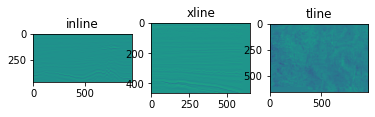

In [10]:


# plt different slices 
plot_random_directions(data, 100)

   

In [11]:
"""
We see that inline and xline directions have clear stacking patterns, 
but the tline is more meshy.

Intuitivly, we would could easily see more clear pattern change in iline/xline direction 
"""

'\nWe see that inline and xline directions have clear stacking patterns, \nbut the tline is more meshy.\n\nIntuitivly, we would could easily see more clear pattern change in iline/xline direction \n'

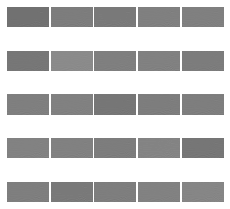

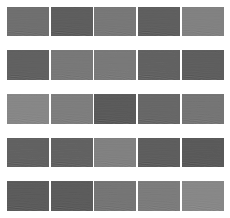

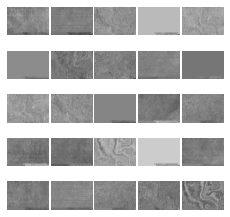

In [12]:
# plot supsets of each direction to visualize patterns in each direction
plot_subset_of_directions(data, directions, 100)

In [5]:
"""
When looking at macroscopic patterns, we see that all do contain such patterns

"""

'\nWhen looking at macroscopic patterns, we see that all do contain such patterns\n\n'

In [31]:
## We then pad each direction to be able to grid it to a 16, 32, 64 ++ grid. 
# The reason we choose such numbers are gupu optimilization (LINK)

# but beforre we can do this we need to pad the images to go up in the wanted patch size
patch_size = 64
#directions = ["inline"]

padded_data = pad_data_to_fit_patch(data, patch_size, directions, num_samples, output_folder)
for dir in directions:
    print("padded_data", padded_data[dir].shape)
    
# plot supsets of each direction to visualize patterns in each direction
#plot_subset_of_directions(padded_data, directions, 100)


padding_needed {'inline': 53}
Found inline
Found xline
Found tline
padded_data (704, 960, 512)


In [32]:
# we have now padded all directions and can extract patched of patch_size 
patch_sizes = [64]
patched_data_dir = {} # remember to runcommment
for ps in patch_sizes:
    patched_data, patched_labels, patched_labels_per_image, patched_labels_per_grid_cell, patched_labels_per_grid_cell, patched_grid_sizes, patched_num_smaples =  create_patched_data(padded_data, ps, directions)
    patched_data_dir[ps] =  patched_data
#patched_data, patched_labels, patched_labels_per_image, patched_labels_per_grid_cell, patched_labels_per_grid_cell, patched_grid_sizes, patched_num_smaples =  create_patched_data(padded_data, patch_size, directions)



dir shape (704, 960, 512)
nm 15 8 84480
patched_data (84480, 64, 64)
patched_labels[dir] [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.] [84470. 84471. 84472. 84473. 84474. 84475. 84476. 84477. 84478. 84479.]
patched_labels_per_image[dir] [0. 0. 0. 0. 0. 0. 0. 0. 0. 0.] [703. 703. 703. 703. 703. 703. 703. 703. 703. 703.]
patched_labels_per_grid_cell[dir] [0. 1. 2. 3. 4. 5. 6. 7. 8. 9.] [110. 111. 112. 113. 114. 115. 116. 117. 118. 119.]


In [15]:
import matplotlib.gridspec as gridspec


def dens_grid_plot(padded_data, patched_data, patched_grid_sizes, patch_size, dir, section, output):
    """ Plots entire section in a dense grid"""
    max = padded_data[dir].shape[0]
    n = patched_grid_sizes[dir][1]
    m = patched_grid_sizes[dir][2]
    nm = patched_grid_sizes[dir][1]*patched_grid_sizes[dir][2]
    # verify a random slice to see if patcheing works
    #random_slice = np.random.choice(max, 1)[0]
    random_slice  = section*nm
    print("random_slice", random_slice) 
    patched_slice = patched_data[dir][random_slice:random_slice+nm]
    plt.figure(figsize = (10,10))

    print("patched_slice", patched_slice.shape)
    plt.figure(figsize = (n,m))
    gs1 = gridspec.GridSpec(m,n)
    gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 
    counter = 1
    for i in range(nm):
       # i = i + 1 # grid spec indexes from 0
        ax1 = plt.subplot(gs1[i])
        plt.axis('off')
        #ax1.set_xticklabels([])
        #ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        plt.imshow(patched_slice[i].reshape(patch_size,patch_size),  cmap='gray')
        counter += 1
    if output:
            filename = output + "/example_patch_grid_image_" + dir +"_"+ str(patch_size) + ".png"
            plt.savefig(filename, bbox_inches='tight')

        
def patch_random_samples(padded_data, patched_data, patched_grid_sizes, patch_size, dir, section, output):
    """ Plots 6 random pathces on the section in a 3x2 grid"""
    # Fixing random state for reproducibility
    import matplotlib.pyplot as plt
    import matplotlib.gridspec as gridspec
    n = patched_grid_sizes[dir][1]
    m = patched_grid_sizes[dir][2]
    nm = patched_grid_sizes[dir][1]*patched_grid_sizes[dir][2]
    section_indexes = section*nm
    plt.figure(figsize = (9,6))
    gs1 = gridspec.GridSpec(2,3)
    gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 

    for i in range(6):
       # i = i + 1 # grid spec indexes from 0
        ax1 = plt.subplot(gs1[i])
        plt.axis('off')
        #ax1.set_xticklabels([])
        #ax1.set_yticklabels([])
        ax1.set_aspect('equal')
        random_slice = np.random.choice(nm, 1)[0]

        ax1.imshow(patched_data[dir][section_indexes + random_slice], cmap='gray')
    if output:
            filename = output + "/example_patch_grid_image_randomsample_" + dir +"_"+ str(patch_size) + ".png"
            plt.savefig(filename, bbox_inches='tight')

random_slice 5000
patched_slice (50, 96, 96)


<Figure size 720x720 with 0 Axes>

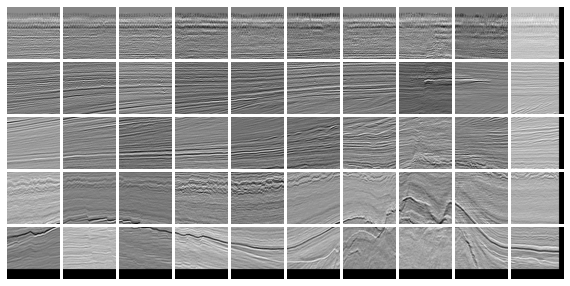

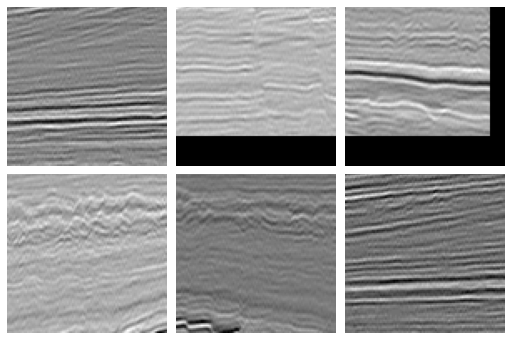

random_slice 3500
patched_slice (35, 96, 96)


<Figure size 720x720 with 0 Axes>

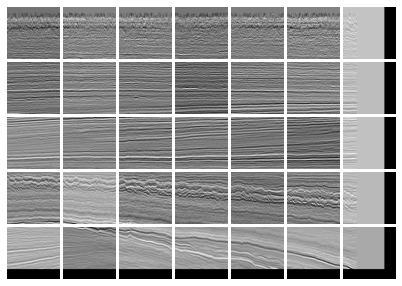

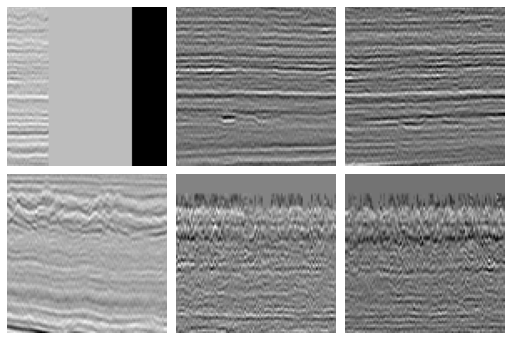

random_slice 7000
patched_slice (70, 96, 96)


<Figure size 720x720 with 0 Axes>

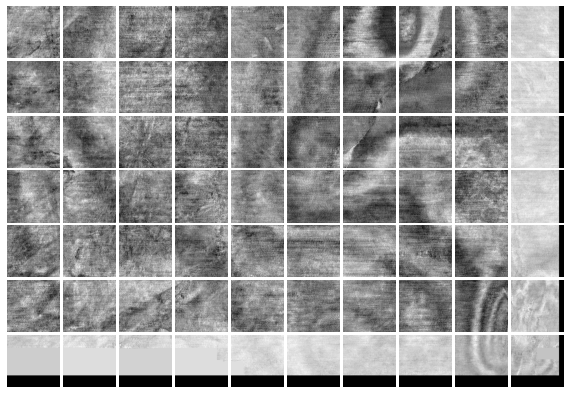

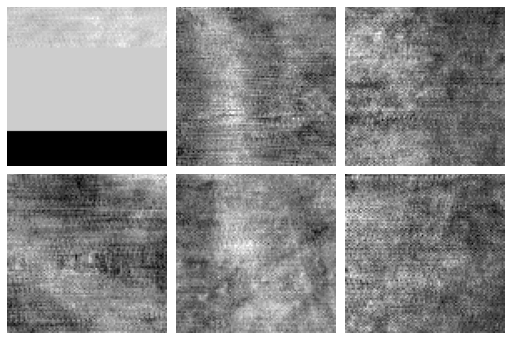

In [16]:
# plot random patches to verify
direction_plot = "tline"
section = 100
#plot_patched_directions(padded_data, patched_data, patched_grid_sizes, patch_size, direction_plot, output_folder)    
#plt.show()
for dir in directions:
    dens_grid_plot(padded_data, patched_data, patched_grid_sizes, patch_size, dir , section, output_folder)    
    plt.show()

    patch_random_samples(padded_data, patched_data, patched_grid_sizes, patch_size, dir , section, output_folder)    
    plt.show()


The color difference is due to the images ha been normalized globally, and are now plottet individually

# Dimension reduction and visualization 

In [20]:
from sklearn.cluster import KMeans
# flatten eaxh directions to be input ready for sklearn 
patched_data["inline"] = patched_data["inline"].reshape(patched_grid_sizes["inline"][0], -1)
patched_data["xline"] = patched_data["xline"].reshape(patched_grid_sizes["xline"][0], -1)
patched_data["tline"] = patched_data["tline"].reshape(patched_grid_sizes["tline"][0], -1)
print("flattten dirs", patched_data["inline"].shape, patched_data["xline"].shape, patched_data["tline"].shape )



flattten dirs (33600, 9216) (33600, 9216) (33600, 9216)


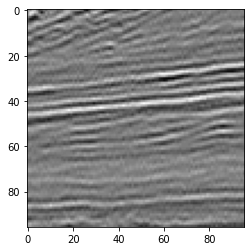

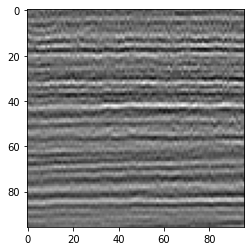

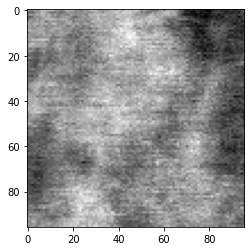

In [21]:

# verify one a single path that it works
for dir in directions:
    random = np.random.choice(patched_data[dir].shape[0], 1)[0]
    plt.imshow(patched_data[dir][random].reshape(patch_size,patch_size), cmap='gray')
    filename = output_folder + "/example_patch" + dir +"_"+ str(patch_size) + ".png"
    #plt.savefig(filename)
    plt.show()

In [22]:
from matplotlib import offsetbox
import cv2

def plot_components(proj, images=None, ax=None,
                    thumb_frac=0.05, cmap='gray'):
    """ Plots thumb_frac number of original proj as thumbnails images over a scatterplot for visualization"""
    ax = ax or plt.gca()
    
    #ax.plot(proj[:, 0], proj[:, 1], '.k')
    
    if images is not None:
        min_dist_2 = (thumb_frac * max(proj.max(0) - proj.min(0))) ** 2
        shown_images = np.array([2 * proj.max(0)])
        for i in range(proj.shape[0]):
            dist = np.sum((proj[i] - shown_images) ** 2, 1)
            if np.min(dist) < min_dist_2:
                # don't show points that are too close
                continue
            shown_images = np.vstack([shown_images, proj[i]])
            imagebox = offsetbox.AnnotationBbox(
                offsetbox.OffsetImage(cv2.resize(images[i].T,  dsize=(32, 32), interpolation=cv2.INTER_CUBIC), cmap=cmap),
                                      proj[i])
            ax.add_artist(imagebox)
    return ax
            
            


In [35]:

from collections import OrderedDict
from functools import partial
from time import time

import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from matplotlib.ticker import NullFormatter
from sklearn.decomposition import PCA

from sklearn import manifold, datasets
import umap

# set n_points to the p
print(int(patched_data[dir].shape[0]*0.1), patched_data[dir].shape[0])
n_points = 2000
n_neighbors = 20
n_components = 2

methods = OrderedDict()
methods['PCA'] = PCA(n_components=2)
pca = {}

LLE = partial(manifold.LocallyLinearEmbedding, n_neighbors, n_components, eigen_solver='auto')
methods['LLE'] = LLE(method='standard')
lle = {}

#methods['LTSA'] = LLE(method='ltsa')
#methods['Hessian LLE'] = LLE(method='hessian')
#methods['Modified LLE'] = LLE(method='modified')
methods['Isomap'] = manifold.Isomap(n_neighbors, n_components)
Isomap = {}

#methods['MDS'] = manifold.MDS(n_components, max_iter=100, n_init=1)
#MDS = {}

#methods['SE'] = manifold.SpectralEmbedding(n_components=n_components,
#                                           n_neighbors=n_neighbors)
#methods['t-SNE'] = manifold.TSNE(n_components=n_components, init='pca', random_state=0)
#t_SNE = {}

reducer_umap = umap.UMAP()
methods['UMAP'] = reducer_umap
UMAP = {}

8448 84480


In [36]:
# Subsample to be bale to compute without waiting for years
sub_sampled = {}
sub_sampled_labels ={}
sub_sampled_labels_per_image = {}
sub_sampled_labels_per_grid_cell = {}
   

# predict manifold

num samples:  2000
Plotting:  PCA
PCA(inline): 0.19 sec


<Figure size 1080x576 with 0 Axes>

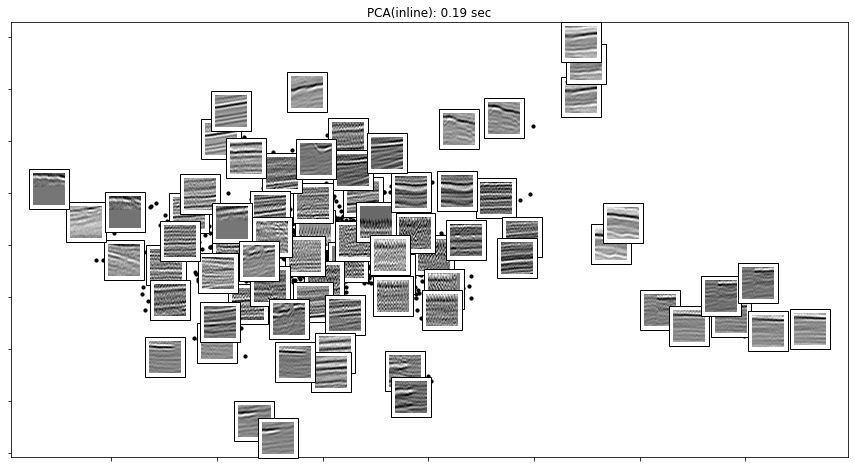

Plotting:  LLE
LLE(inline): 8.2 sec


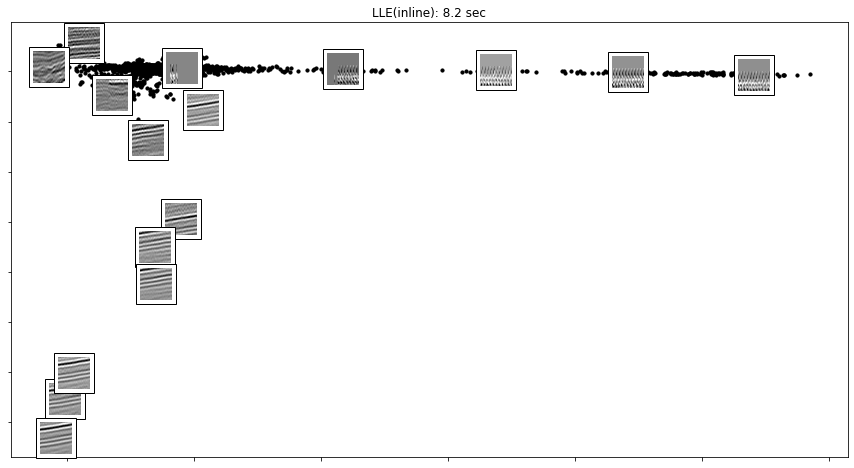

Plotting:  Isomap
Isomap(inline): 9.9 sec


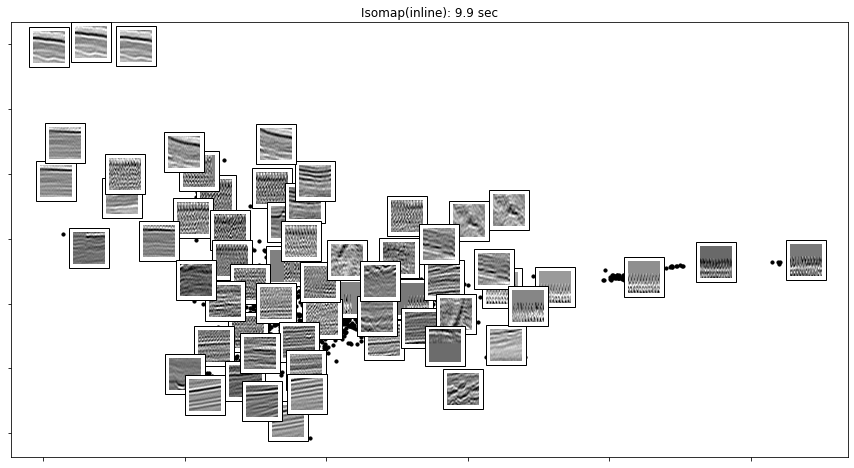

Plotting:  MDS
MDS(inline): 6.9 sec


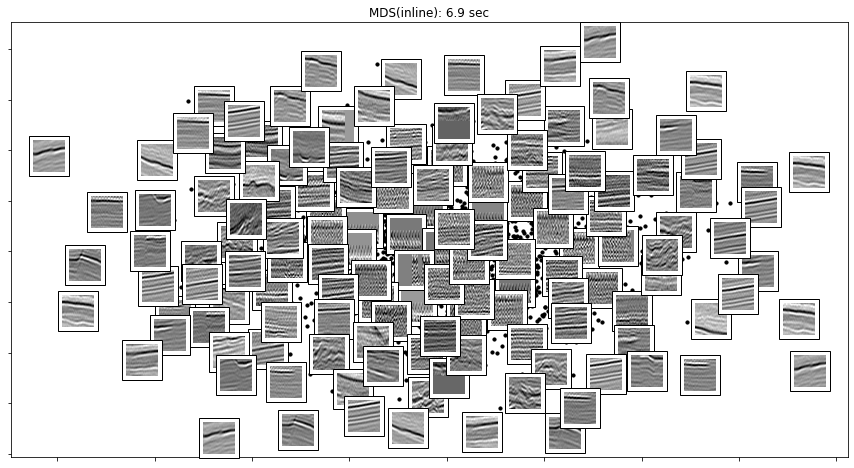

Plotting:  t-SNE
t-SNE(inline): 20 sec


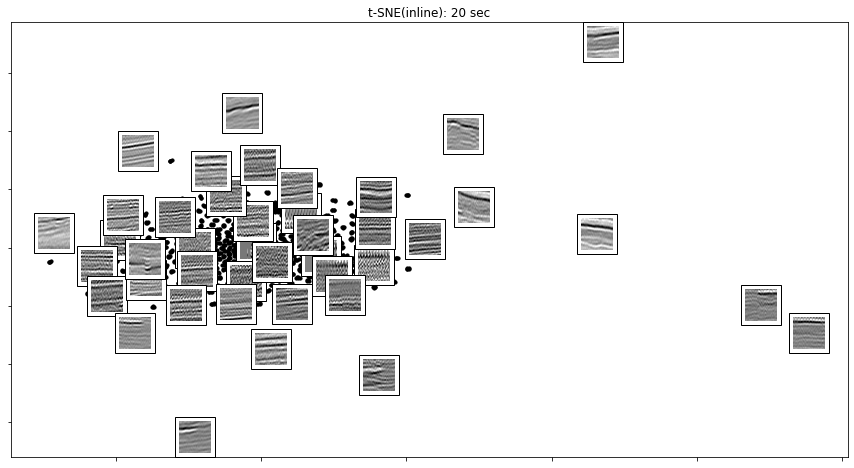

Plotting:  UMAP


/usr/local/lib/python3.7/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 11000. The TBB threading layer is disabled.
  warnings.warn(problem)


UMAP(inline): 12 sec


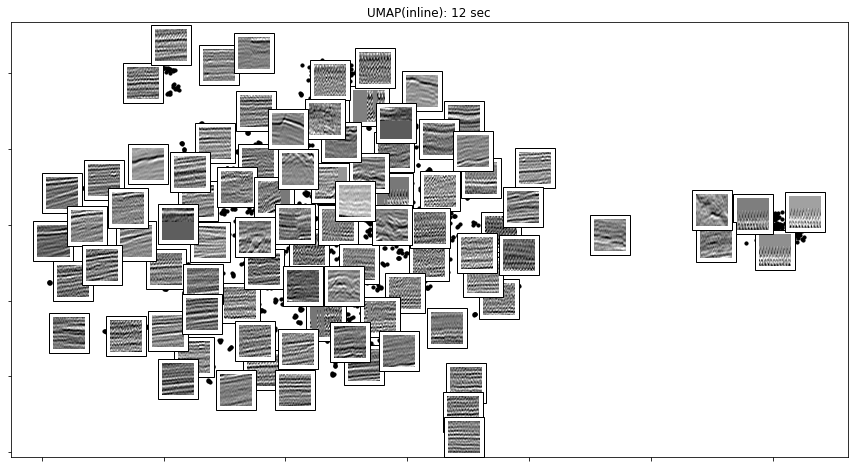

num samples:  2000
Plotting:  PCA
PCA(xline): 0.2 sec


<Figure size 1080x576 with 0 Axes>

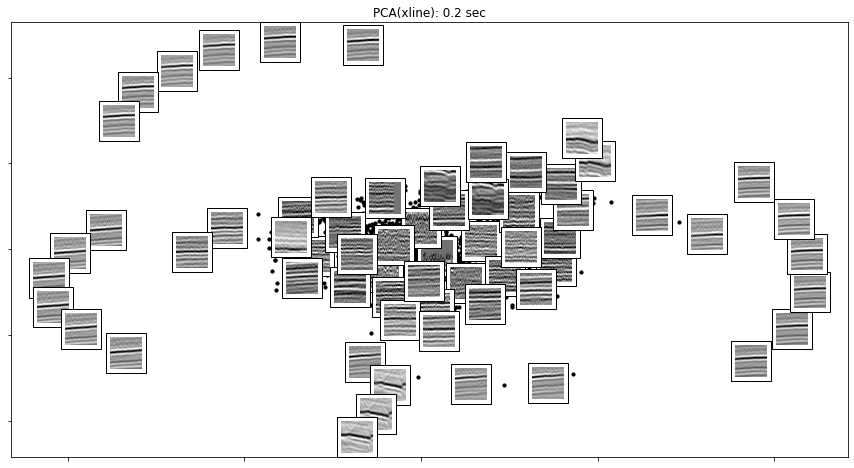

Plotting:  LLE
LLE(xline): 8.3 sec


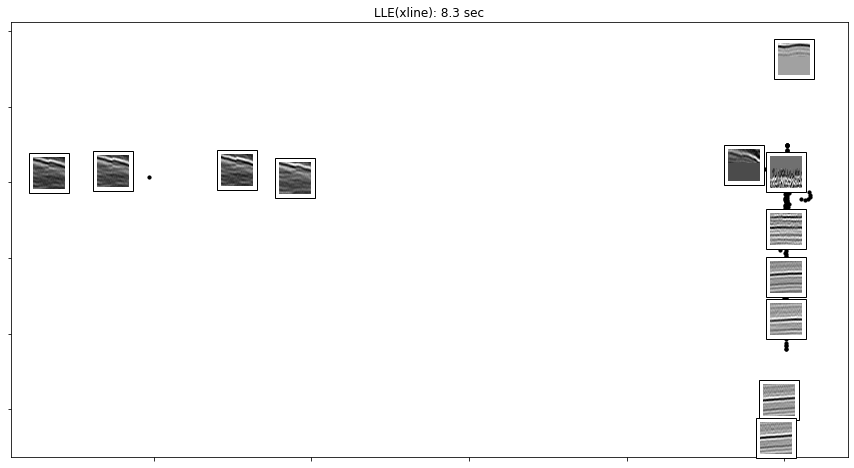

Plotting:  Isomap


/usr/local/lib/python3.7/site-packages/sklearn/utils/extmath.py:530: RuntimeWarning: invalid value encountered in multiply
  v *= signs[:, np.newaxis]


Isomap(xline): 10 sec


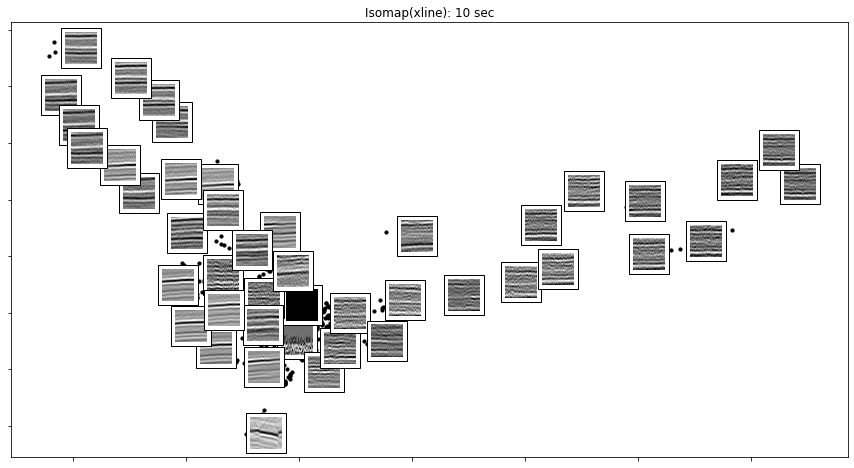

Plotting:  MDS
MDS(xline): 7.1 sec


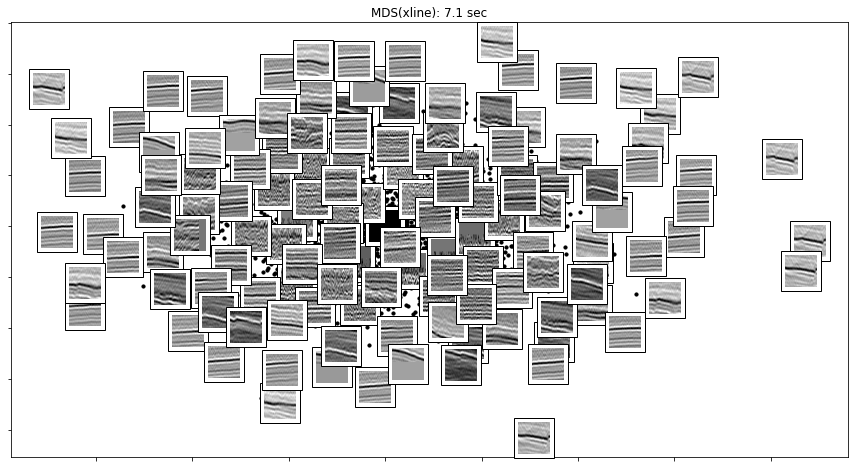

Plotting:  t-SNE
t-SNE(xline): 21 sec


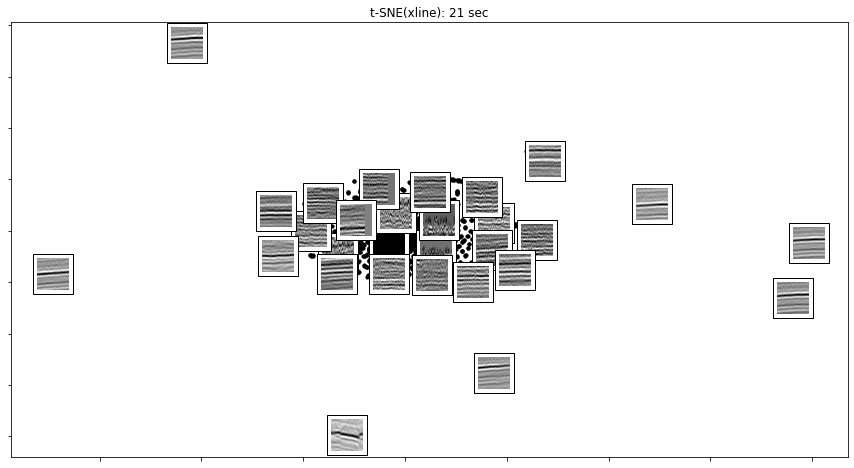

Plotting:  UMAP
UMAP(xline): 6.9 sec


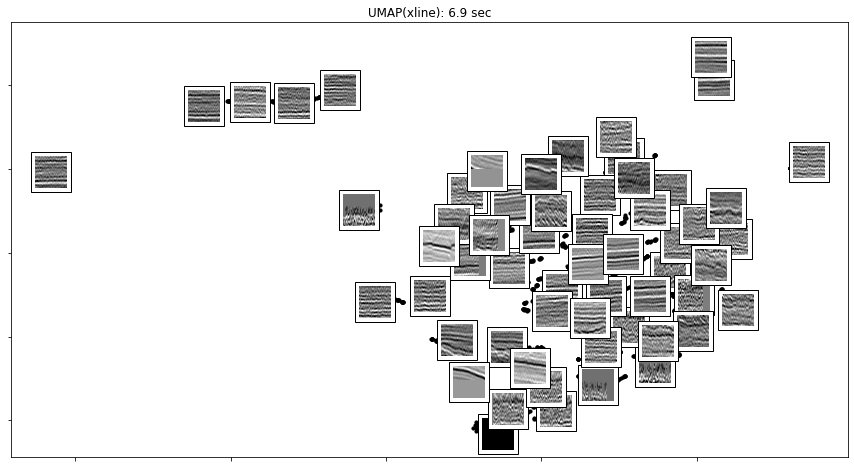

num samples:  2000
Plotting:  PCA
PCA(tline): 0.092 sec


<Figure size 1080x576 with 0 Axes>

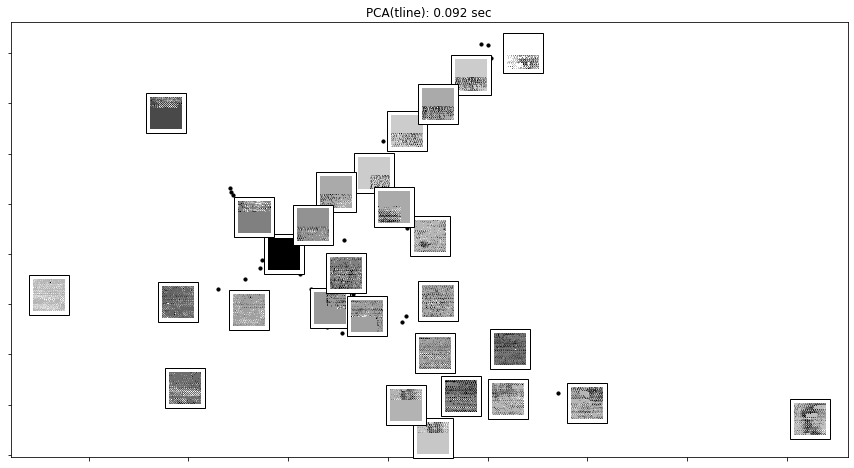

Plotting:  LLE
LLE(tline): 7.8 sec


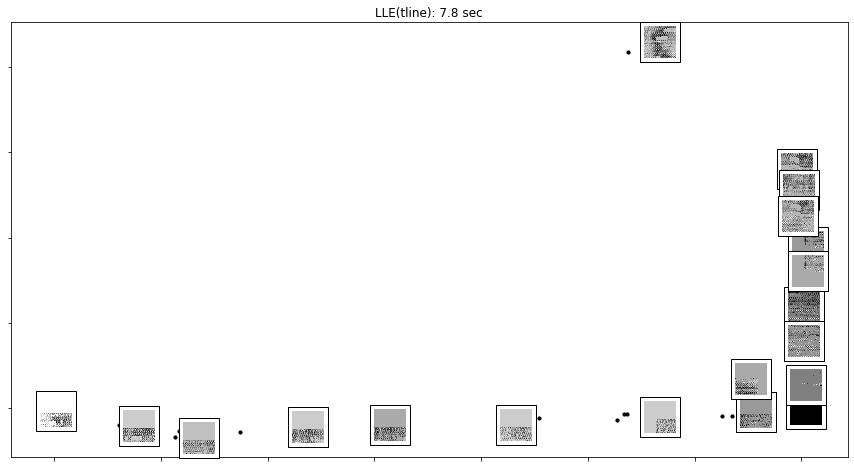

Plotting:  Isomap
Isomap(tline): 15 sec


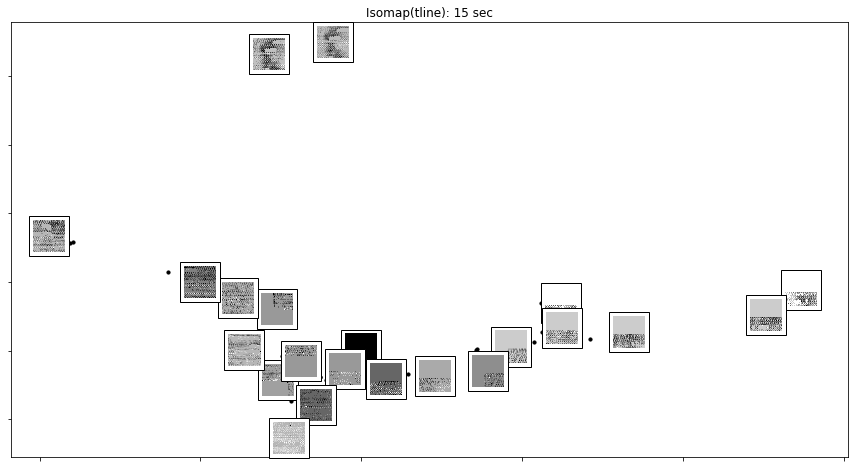

Plotting:  MDS
MDS(tline): 3.9 sec


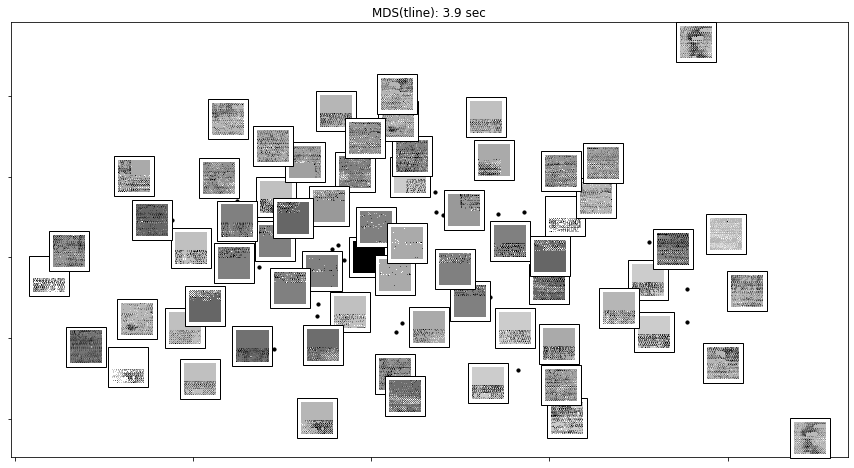

Plotting:  t-SNE
t-SNE(tline): 19 sec


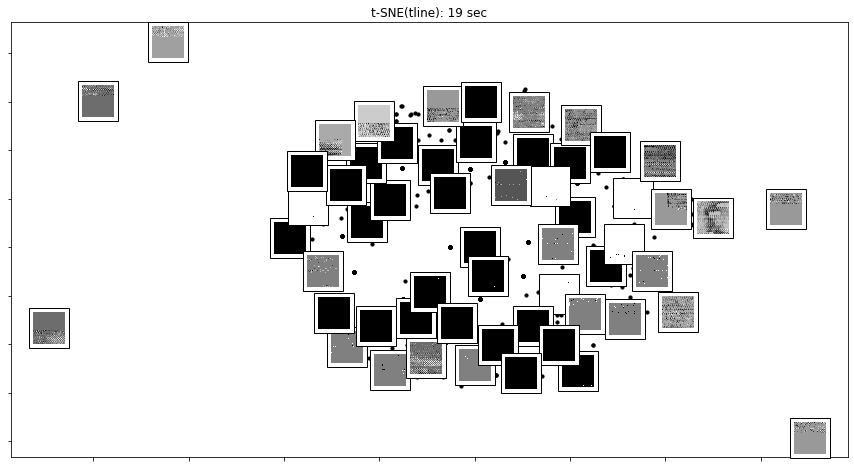

Plotting:  UMAP
UMAP(tline): 11 sec


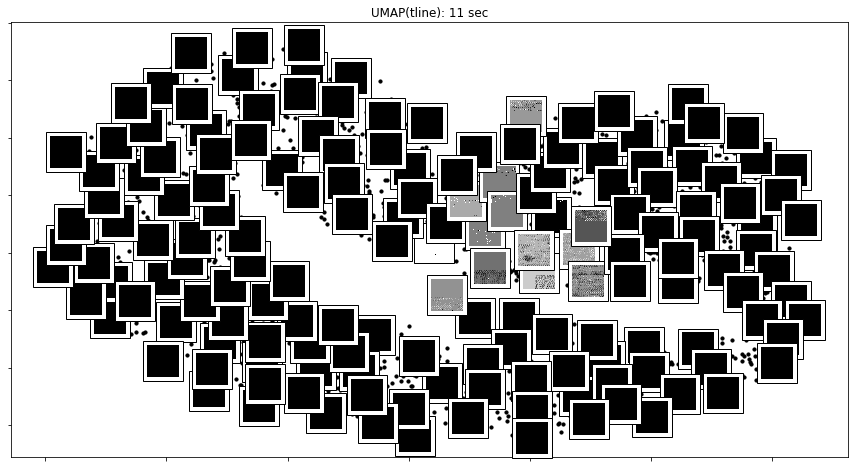

In [13]:
# PREDICT MANIFOLD
results = {}
for dir in directions:
    print("num samples: ", n_points)
    results[dir] ={}
    sub_sampled[dir] = patched_data[dir][10:n_points]
    sub_sampled_labels[dir] = patched_labels[dir][10:n_points]
    sub_sampled_labels_per_image[dir] = patched_labels_per_image[dir][10:n_points]
    sub_sampled_labels_per_grid_cell[dir] = patched_labels_per_grid_cell[dir][10:n_points]
    # Create figure
    fig = plt.figure(figsize=(15, 8))
    fig.suptitle("Manifold Learning with %i points, %i neighbors"
                 % (1000, n_neighbors), fontsize=14)
    # Plot results

    for i, (label, method) in enumerate(methods.items()):
        print("Plotting: ", label)
        fig = plt.figure(figsize=(15, 8))

        t0 = time()
        Y = method.fit_transform(sub_sampled[dir])
        filename = output_folder + "/" + label +"_"+ dir + "_"+ str(patch_size) + ".npy"
        np.save(filename, Y)
        t1 = time()
        results[dir][label] = {}
        results[dir][label]["time"]=[]
        results[dir][label]["time"].append(t1 - t0)
        results[dir][label]["data"] = Y
        print("%s(%s): %.2g sec" % (label,dir, t1 - t0))
        #ax = fig.add_subplot(10, 10, 2 + i + (i > 3))
        ax = plt.subplot()
        plt.scatter(Y[:, 0], Y[:, 1], s=10,color="black")# c=sub_sampled_labels_per_image[dir],cmap=plt.cm.get_cmap('viridis', n_points)) #cmap=plt.cm.Spectral)        
        #plt.colorbar(ticks=np.arange(0,n_points,n_points/2), ax=ax)

        ax.set_title("%s(%s): %.2g sec" % (label, dir, t1 - t0))
        ax.xaxis.set_major_formatter(NullFormatter())
        ax.yaxis.set_major_formatter(NullFormatter())
        ax.axis('tight')
        
        filename_plot = output_folder + "/" + label +"_"+ dir + "_"+ str(patch_size) 
        plt.savefig(filename_plot)
        
       

        # Plot acutal images on scatterplot
        images = sub_sampled[dir]
        plot_components(proj=Y,images=[np.reshape(i, (patch_size, patch_size)).T for i in images])
        filename_plot_thumbnail = output_folder + "/" + label +"_"+ dir + "_"+ str(patch_size) + "_thumbnail"
        plt.savefig(filename_plot_thumbnail)
        plt.show()

# Retrieve manifold

In [37]:
patch_sizes = [16, 32, 64, 96]
results = {}
for ps in patch_sizes:
    results[ps] ={}
    for dir in directions:
        results[ps][dir] ={}

        for i, (label, method) in enumerate(methods.items()):
            filename = output_folder + "/" + label +"_"+ dir + "_"+ str(ps) + ".npy"
            print("Retrieving: ", filename)
            results[ps][dir][label] = {}
            results[ps][dir][label]["data"] = np.load(filename)
            print("Done retrieving: ", filename)
        print("done with : ", dir)
    print("done")
          
for dir in directions:
    print("num samples: ", n_points)
    results[dir] ={}
    sub_sampled[dir] = patched_data[dir][10:n_points]
    sub_sampled_labels[dir] = patched_labels[dir][10:n_points]
    sub_sampled_labels_per_image[dir] = patched_labels_per_image[dir][10:n_points]
    sub_sampled_labels_per_grid_cell[dir] = patched_labels_per_grid_cell[dir][10:n_points]

Retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/PCA_inline_16.npy
Done retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/PCA_inline_16.npy
Retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/LLE_inline_16.npy
Done retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/LLE_inline_16.npy
Retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/Isomap_inline_16.npy
Done retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/Isomap_inline_16.npy
Retrieving:  /Users/anderskampenes/Documents/Dokumenter/NTNU/MASTER/code/notebooks/02-data_sequence_analysis_patch/UMAP_inline_16.npy
Done retrieving:  /Users/anderskampenes/Documen


PLotting new grid:



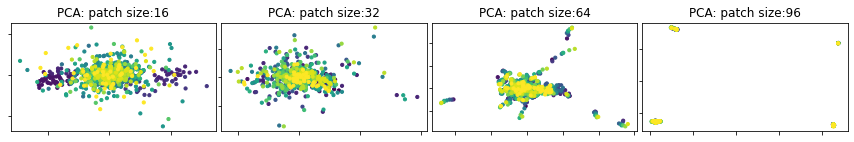

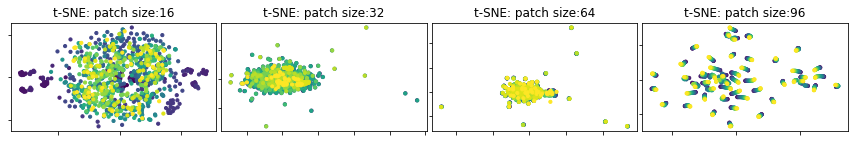

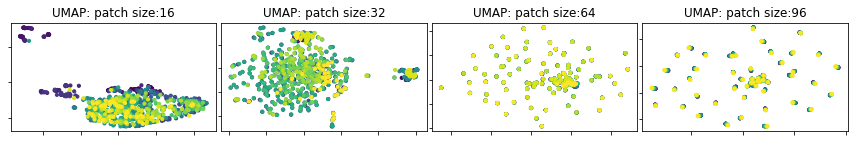


PLotting new grid:



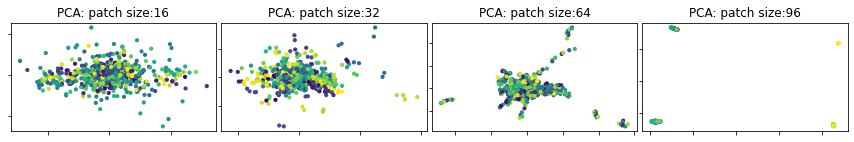

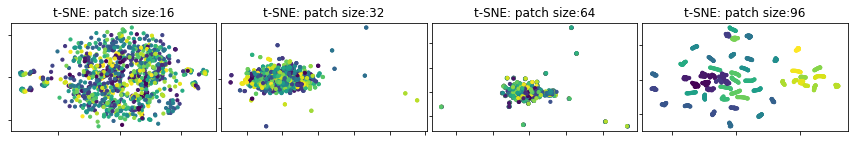

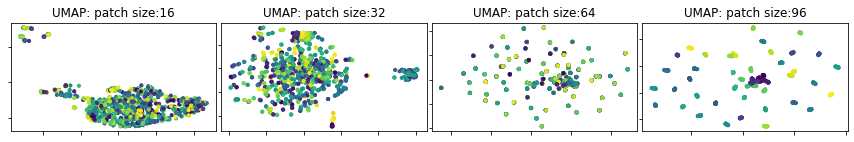

In [27]:
### plot a manifold learner foreach direciton
import matplotlib.gridspec as gridspec
dir = "inline"
label_colors = [sub_sampled_labels_per_image[dir], sub_sampled_labels_per_grid_cell[dir]]
counter = 0
for lb in label_colors:
    print("")
    print("PLotting new grid:")
    print("")
    for (label, method) in methods.items():
        i = 0
        plt.figure(figsize = (15,2))
        gs1 = gridspec.GridSpec(1,4)
        gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 
        for ps in patch_sizes:
            data =  results[ps][dir][label]["data"][:int(n_points/2)-10]
           # i = i + 1 # grid spec indexes from 0
            ax1 = plt.subplot(gs1[i])
            #plt.axis('off')
            #ax1.set_xticklabels([])
            #ax1.set_yticklabels([])
            #ax1.set_aspect('equal')
            ax1.xaxis.set_major_formatter(NullFormatter())
            ax1.yaxis.set_major_formatter(NullFormatter())
            #ax1.axis('tight')
            ax1.set_title("%s: patch size:%s" % (label, ps))
            #ax1.set_title("%s(%s): %s" % (label, dir, ps))
            plt.scatter(data[:, 0], data[:, 1], s=10, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")
            i+=1
        filename = output_folder + "/_patch_size_grid_ manifold" +str(i)+"_" + label +"_"+ dir + "_"+ str(counter)
        plt.savefig(filename)
        counter +=1
    
    plt.show()



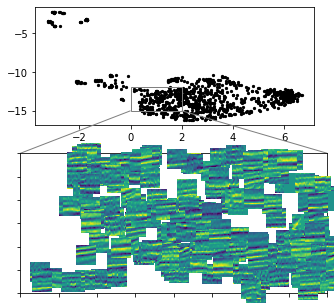

In [48]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset

ps=16
dir ="inline"
label ="UMAP"
label_colors = [sub_sampled_labels_per_image[dir], sub_sampled_labels_per_grid_cell[dir]]
lb = label_colors[0]
images = patched_data_dir[ps][dir]
data = results[ps][dir][label]["data"][:int(n_points/2)-10]


fig, ax = plt.subplots(1, figsize=(5,5))
fig.subplots_adjust( bottom=0.55)
ax.scatter(data[:, 0], data[:, 1],  s=5,  color="black")#c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', n_points))


# # Setup zoom window
axins = zoomed_inset_axes(ax, 6, loc='lower left', bbox_to_anchor=(0,0), borderpad=3)
mark_inset(ax, axins, loc1=2, loc2=1, fc="none", ec="0.5")
axins.set_xlim([0,2])
axins.set_ylim([-12,-15])
plt.yticks(visible=False)
plt.xticks(visible=False)

images = [np.reshape(i, (ps, ps)) for i in images]
image_zoom=1.2
artists = []
for xy, i in zip(data, images):
    x0, y0 = xy
    img = OffsetImage(i, zoom=image_zoom)
    ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
    artists.append(axins.add_artist(ab))
#axins.update_datalim(data)
#axins.autoscale()

filename = output_folder + "/patch_grid_zoom" + label +"_"+ dir + "_"+ str(ps) + "_thumbnail__"
plt.savefig(filename)




PLotting new grid:



ValueError: cannot reshape array of size 9216 into shape (64,64)

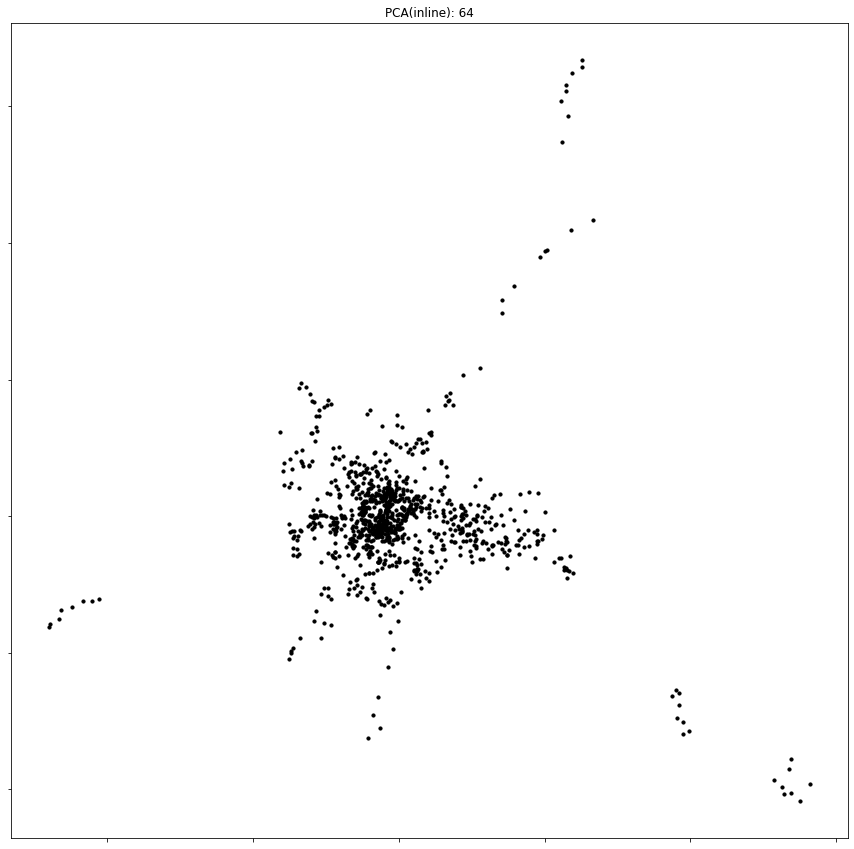

In [63]:
### plot a manifold learner foreach direciton
import matplotlib.gridspec as gridspec
dir = "inline"

print("")
print("PLotting new grid:")
print("")
for (label, method) in methods.items():
    i = 0
    plt.figure(figsize = (15,15))
    gs1 = gridspec.GridSpec(1,1)
    gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 
    for ps in [64]:
        data =  results[ps][dir][label]["data"][:int(n_points/2)-10]
       # i = i + 1 # grid spec indexes from 0
        ax1 = plt.subplot(gs1[i])
        #plt.axis('off')
        #ax1.set_xticklabels([])
        #ax1.set_yticklabels([])
        #ax1.set_aspect('equal')
        ax1.xaxis.set_major_formatter(NullFormatter())
        ax1.yaxis.set_major_formatter(NullFormatter())
        #ax1.axis('tight')
        ax1.set_title("%s(%s): %s" % (label, dir, ps))
        plt.scatter(data[:, 0], data[:, 1], s=10, color="black")#c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")
         # Plot acutal images on scatterplot
        #         images = patched_data_dir[ps][dir]
        images = patched_data[dir]
        #print("img shape", images.shape)
        plot_components(proj=data,images=[np.reshape(i, (ps, ps)).T for i in images], thumb_frac=0.05)
        i+=1

plt.show()




PLotting new grid:



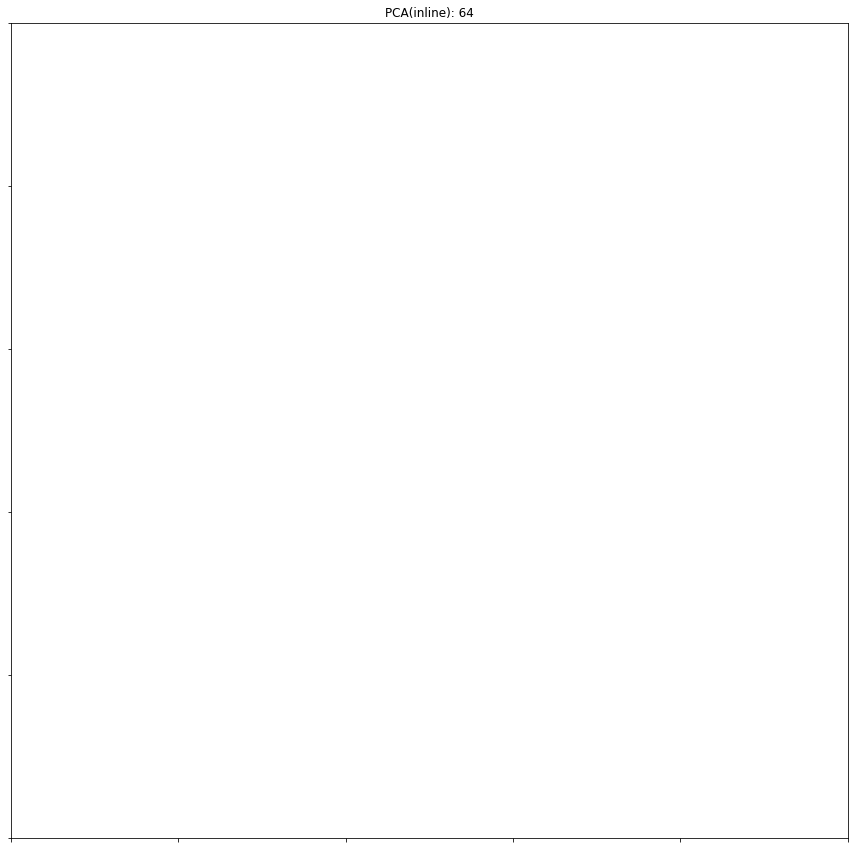

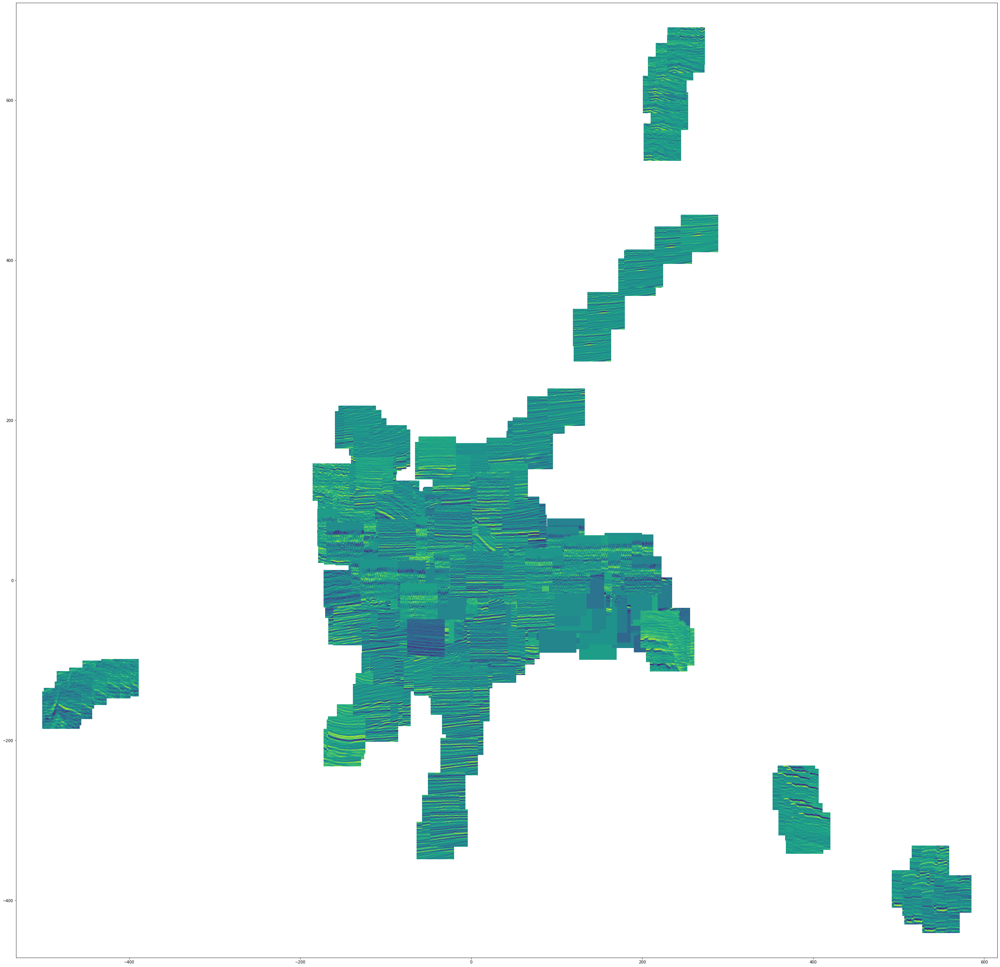

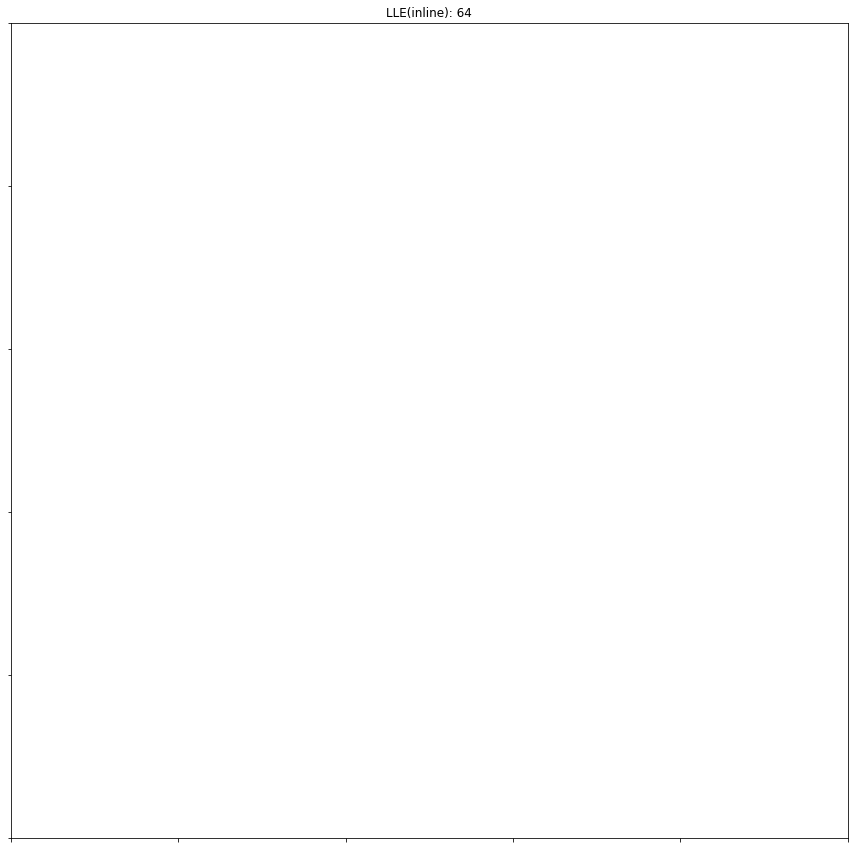

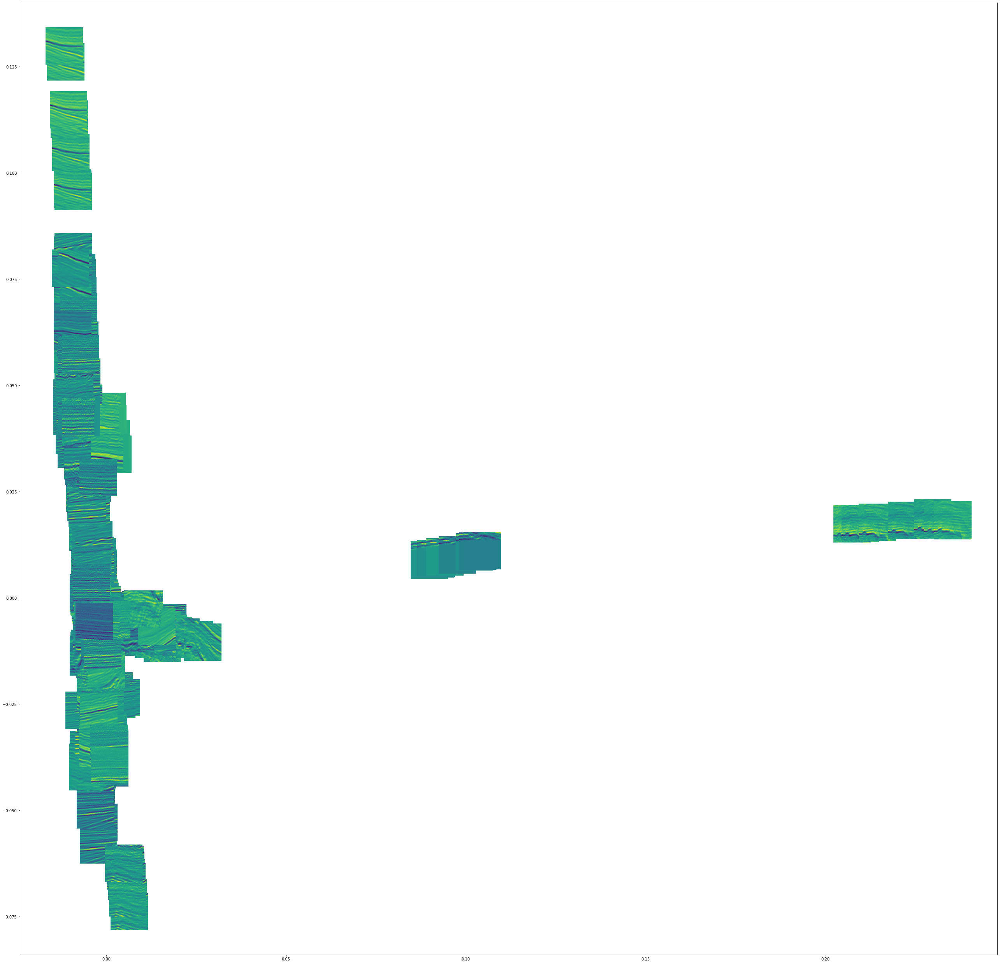

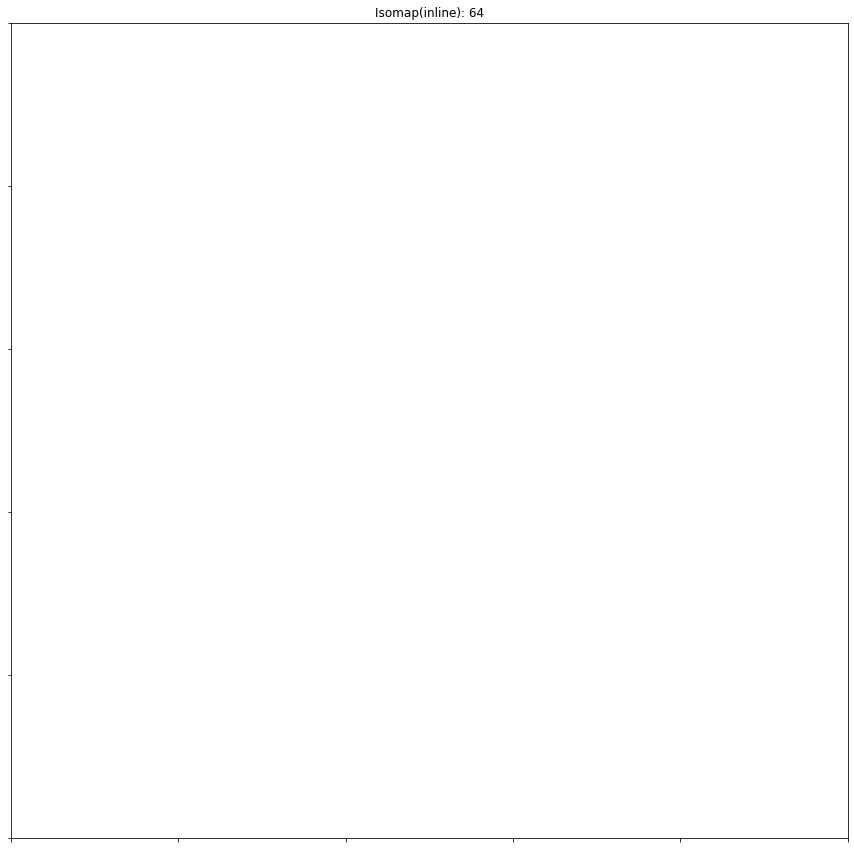

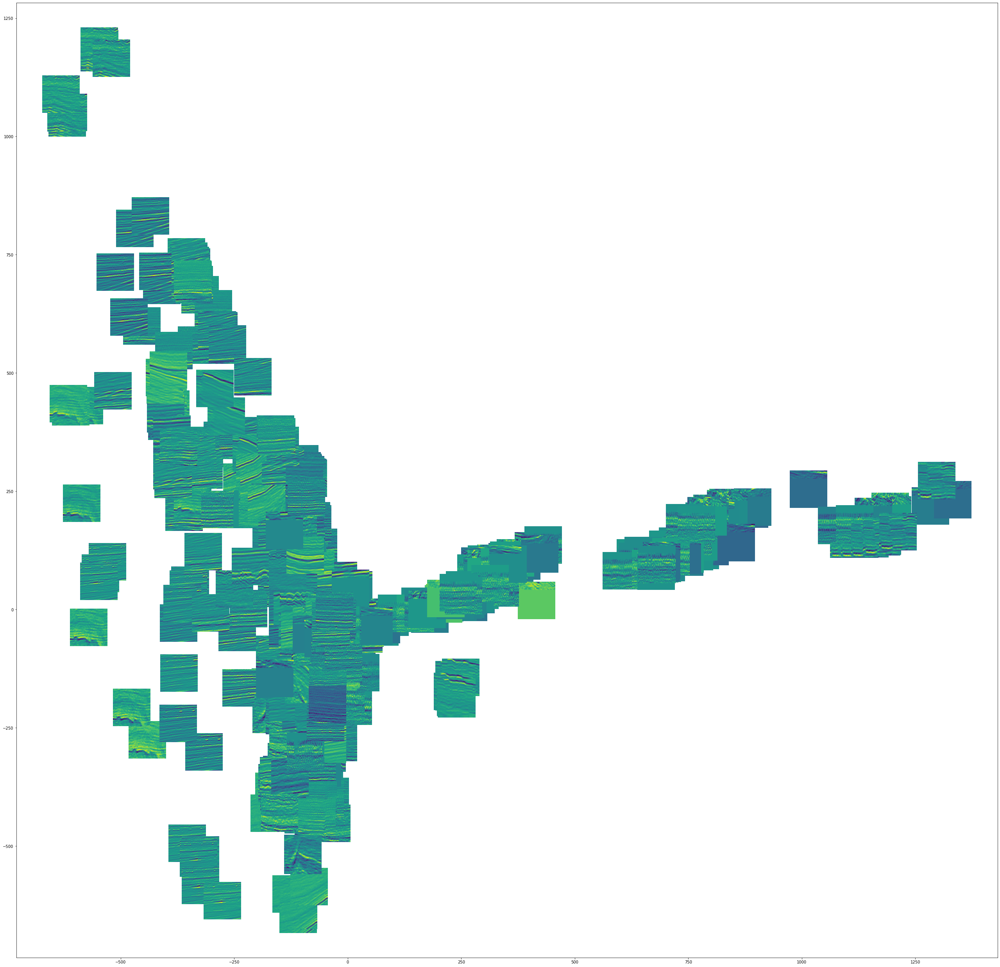

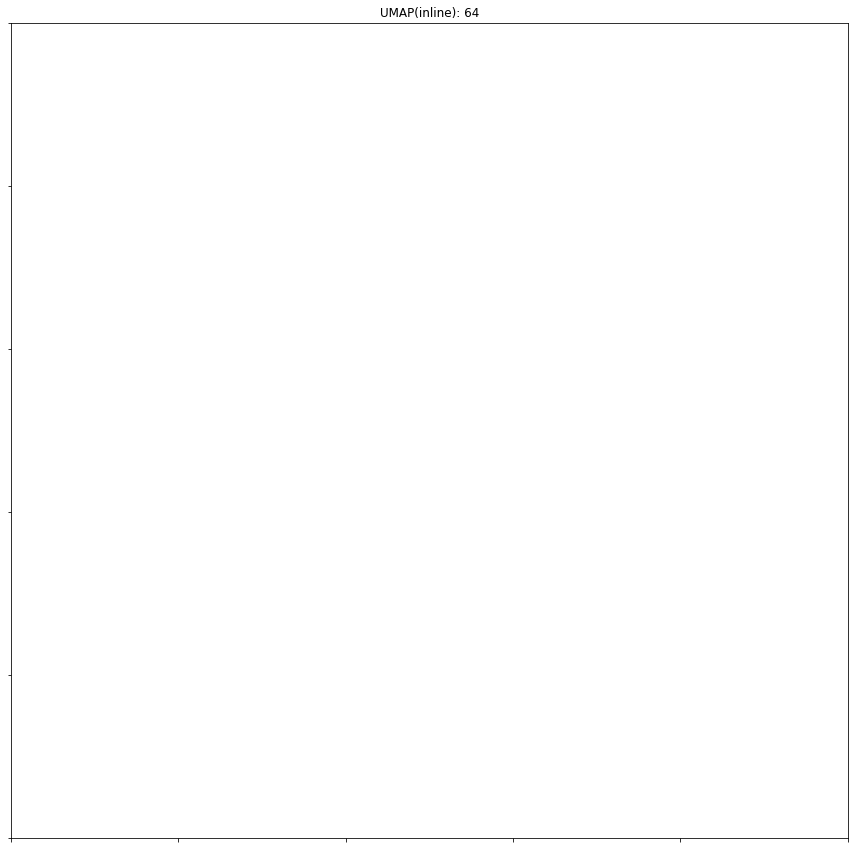

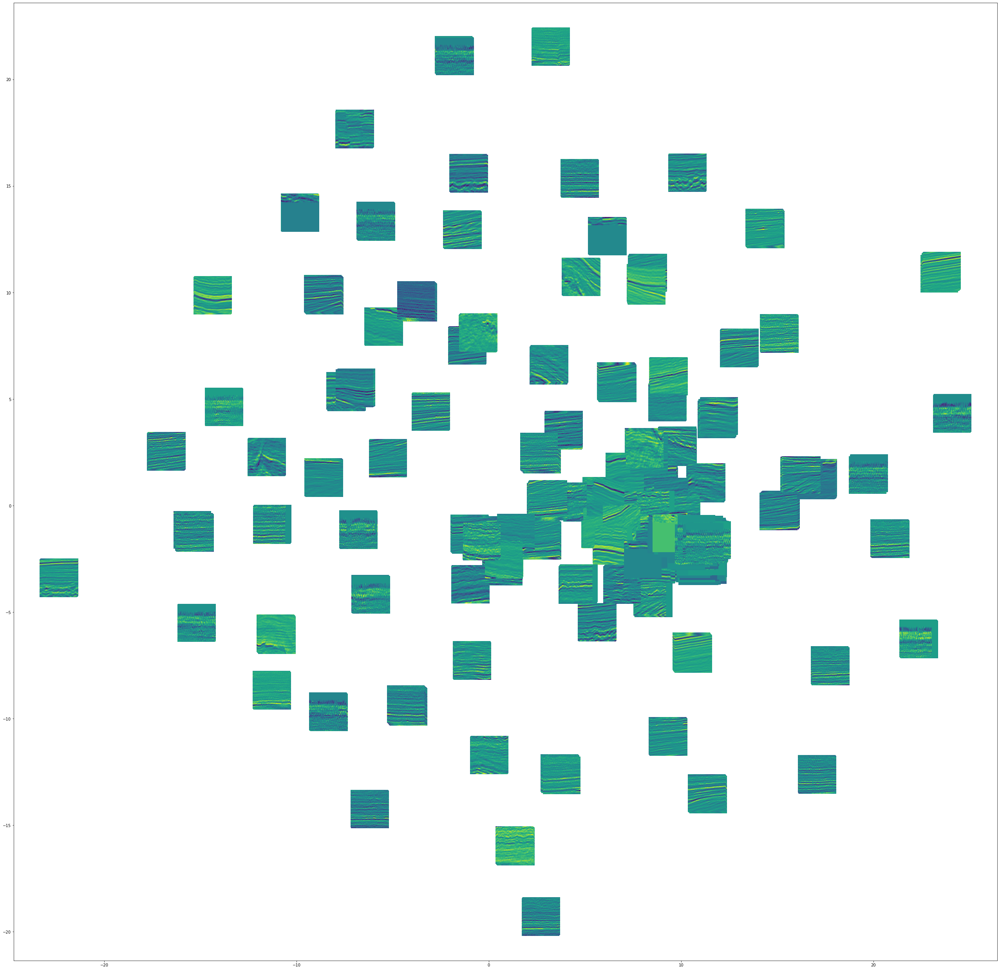

In [20]:
### plot a manifold learner foreach direciton
import matplotlib.gridspec as gridspec
dir = "inline"

print("")
print("PLotting new grid:")
print("")
for (label, method) in methods.items():
    i = 0
    plt.figure(figsize = (15,15))
    gs1 = gridspec.GridSpec(1,1)
    gs1.update(wspace=0.025, hspace=0.05) # set the spacing between axes. 
    for ps in [64]:
        data =  results[ps][dir][label]["data"][:int(n_points/2)-10]
       # i = i + 1 # grid spec indexes from 0
        ax1 = plt.subplot(gs1[i])
        #plt.axis('off')
        #ax1.set_xticklabels([])
        #ax1.set_yticklabels([])
        #ax1.set_aspect('equal')
        ax1.xaxis.set_major_formatter(NullFormatter())
        ax1.yaxis.set_major_formatter(NullFormatter())
        #ax1.axis('tight')
        ax1.set_title("%s(%s): %s" % (label, dir, ps))
        #plt.scatter(data[:, 0], data[:, 1], s=10, color="black")#c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")
         # Plot acutal images on scatterplot
        #images = patched_data_dir[ps][dir]
        images = patched_data[dir]
        plots = results[ps][dir][label]["data"][:int(n_points/2)-10]
        #filename = output_folder + "/" + label +"_sliceplot_" + dir + "_"+str(ps) + ".png"
        visualize_scatter_with_images(plots, images = [np.reshape(i, (ps, ps)) for i in images], image_zoom=1.5)

plt.show()



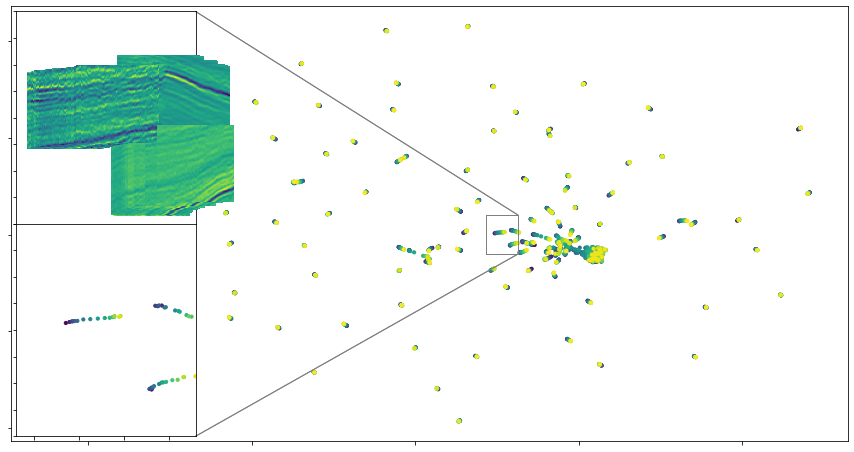

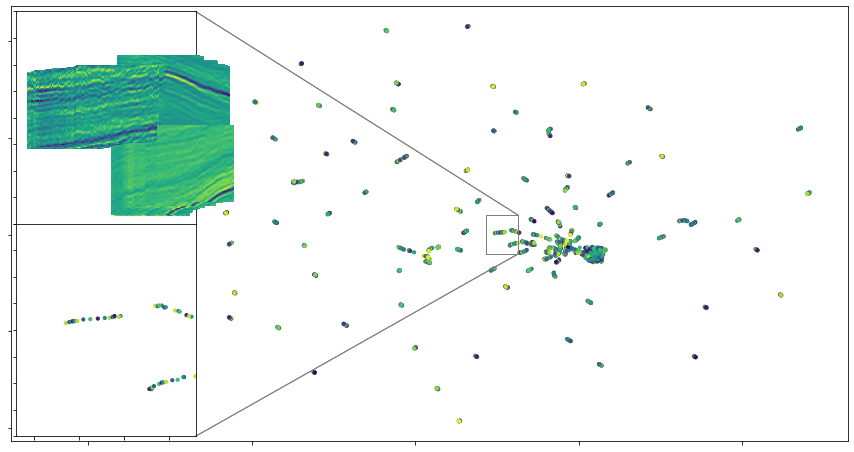

In [102]:
# narrower view of one model
learner = "UMAP"
ps =64
dir = "inline"
#for lb in label_colors:
i = 0 
for lb in label_colors:

    data =  results[ps][dir][learner]["data"][:int(n_points)-10]
    #labels =patched_labels_per_image[dir][10:int(n_points/2)]#patched_labels_per_grid_cell[dir]
   
    fig = plt.figure(figsize=(15, 8))
    ax = plt.subplot()
    #plt.scatter(data[:, 0], data[:, 1], s=10,color="black")
    plt.scatter(data[:, 0], data[:, 1], s=10, c=lb[:int(n_points)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")
    #ax.set_title("%s(%s): patch size %s" % (learner, dir, ps))
    ax.xaxis.set_major_formatter(NullFormatter())
    ax.yaxis.set_major_formatter(NullFormatter())
    ax.axis('tight')

    # Plot acutal images on scatterplot
    images = patched_data_dir[ps][dir]
    #images = patched_data[dir]
    #print("img shape", images.shape)
    #plot_components(proj=data,images=[np.reshape(i, (ps, ps)).T for i in images], thumb_frac=0.05)
    filename = output_folder + "/_geoindex_" +str(i)+"_" + learner +"_"+ dir + "_"+ str(ps) 
    plt.savefig(filename)
    # # Setup zoom window
    axins = zoomed_inset_axes(ax, 5.5, loc='upper left')
    mark_inset(ax, axins, loc1=1, loc2=1, fc="none", ec="0.5")
    axins.set_xlim([4.3,6.3])
    axins.set_ylim([-2,2])
    plt.yticks(visible=False)
    plt.xticks(visible=False)

    images = [np.reshape(i, (ps, ps)) for i in images]
    image_zoom=1.2
    artists = []
    for xy, j in zip(data, images):
        x0, y0 = xy
        img = OffsetImage(j, zoom=image_zoom)
        ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
        artists.append(axins.add_artist(ab))
    axins.scatter(data[:, 0], data[:, 1], s=10, c=lb[:int(n_points)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")

    axins2 = zoomed_inset_axes(ax, 5.5, loc='lower left', )
    mark_inset(ax, axins2, loc1=4, loc2=4, fc="none", ec="0.5")
    axins2.set_xlim([4.3,6.3])
    axins2.set_ylim([-2,2])
    plt.yticks(visible=False)
    plt.xticks(visible=False)
    plt.scatter(data[:, 0], data[:, 1], s=10, c=lb[:int(n_points)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")

    #axins.update_datalim(data)
    #axins.autoscale()
    filename = output_folder + "/_geoindex_" +str(i)+"_" + learner +"_"+ dir + "_"+ str(ps) + "_thumbnail__"
    plt.savefig(filename, bbox_inches='tight')
    i+=1




[0.044, 0.195, 0.455, 3.65]
[2.9, 8.25, 37.5, 80.5]
[4.3, 9.95, 37.5, 64]
[14, 20.5, 47.5, 80]
[5.9, 9.45, 12.1, 17.5]


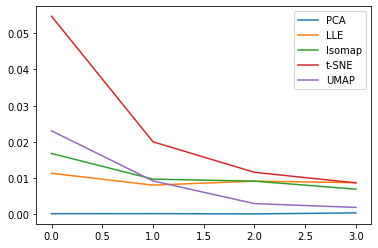

In [202]:
devider = [16*16, 32*32, 64*64, 96*96]
y={
    "PCA":  [0.044, 0.195, 0.455, 3.65], 
    "LLE":[2.9, 8.25, 37.5, 80.5],
    "Isomap":[4.3, 9.95, 37.5, 64],
    "t-SNE":[14, 20.5,47.5, 80],
    "UMAP":[5.9, 9.45, 12.1, 17.5],
}
x = np.arange(4)
fig, ax = plt.subplots()

for (label, arr) in y.items():
    print(arr)
    line, = plt.plot(x, [x  devider[i] for i,x in enumerate(arr)], label=label)
    ax.legend()

plt.show();

num_labelsss 2 2.0
num_labelsss 3 3.0
num_labelsss 1 1.0


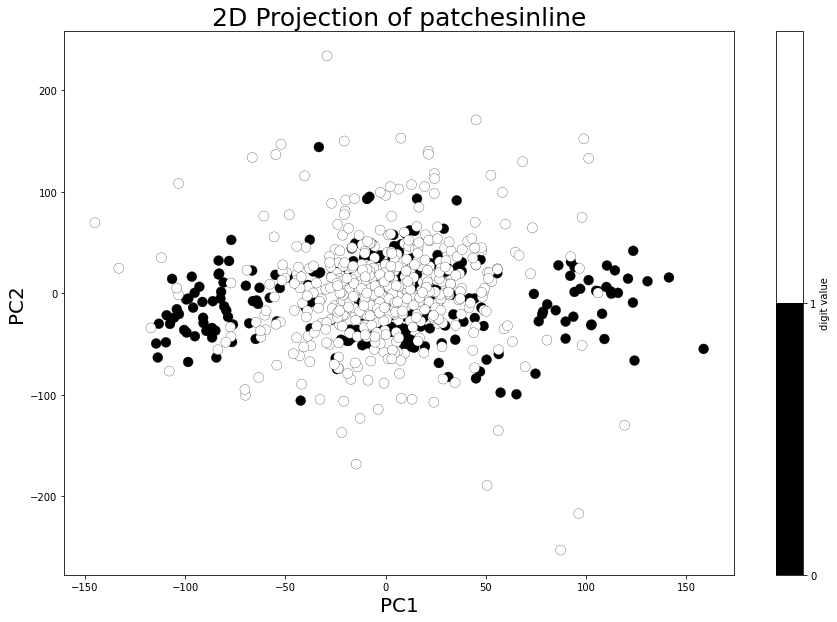

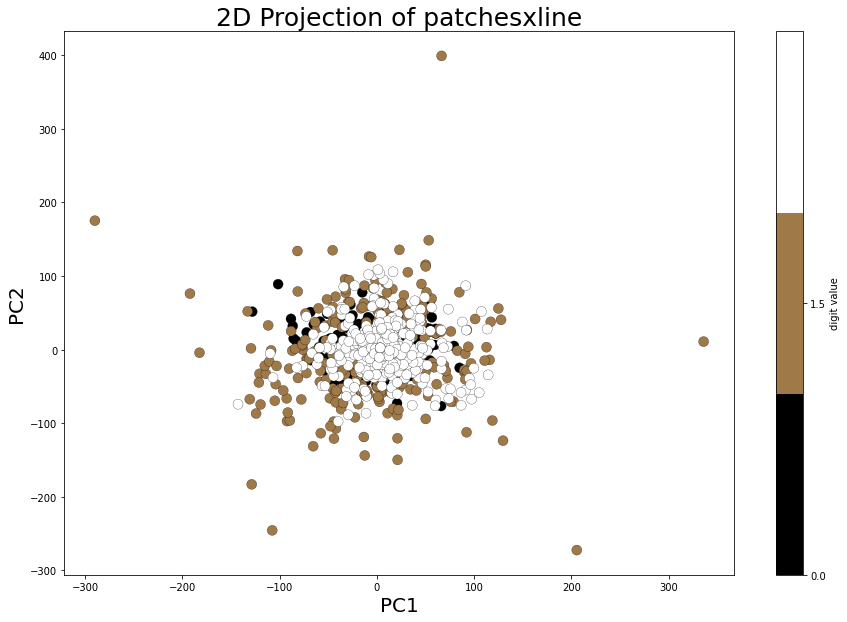

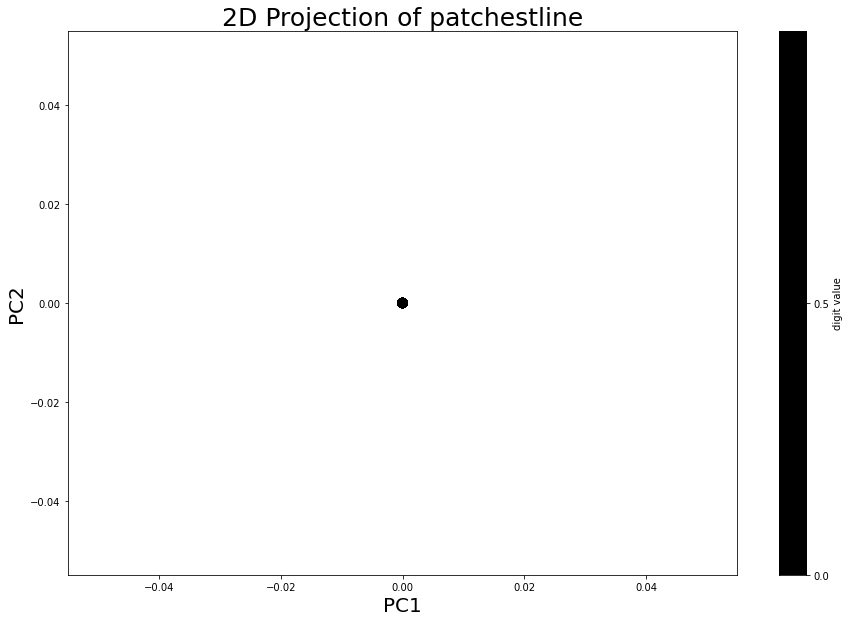

In [32]:
### plot a manifold learner foreach direciton
learner = "PCA"
ps = 32
for dir in directions:
    data =  results[ps][dir][learner]["data"][:int(n_points/2)-10]
    labels =patched_labels_per_image[dir][10:int(n_points/2)]#patched_labels_per_grid_cell[dir]
    num_labels = int(np.max(labels))
    print("num_labelsss", num_labels, labels[-1])
    scatter(data, labels, num_labels, dir, show_labels=False) 
    
    

    # Plot acutal images on scatterplot
    print("Plottting: ", data.shape)
    images = patched_data[dir]
    plot_components(proj=data,images=[np.reshape(i, (patch_size, patch_size)).T for i in images])

[0.09164810180664062]
0 [0.09164810180664062]


KeyError: 'PCA'

In [ ]:
for dir in directions:
    print(patched_labels[dir].shape)
    
    filename = output_folder + "/pca_" + dir + ".npy"
    if not os.path.exists(filename):
        print("did not find data.. creating new...")
        print("dir", dir, patched_data[dir].shape, len(patched_labels[dir]), patched_num_smaples[dir])
        pca_digits=PCA(2)
        pca[dir] = pca_digits.fit_transform(patched_data[dir]) 
        print(np.sum(pca_digits.explained_variance_ratio_))
        # store the data 
        np.save(filename, pca[dir])
    else:
        print("found data. loading it to memory")
        pca[dir] = np.load(filename)
    
    

(84480,)
did not find data.. creating new...
dir inline (84480, 4096) 84480 84480


num_labelsss 119 39.0
Plottting:  [[  79.6950827   -82.91819932]
 [ 153.27310891 -133.90308569]
 [ 147.73692729 -134.69045755]
 ...
 [ -53.2844282   -75.70954476]
 [  32.60382805  -45.86623089]
 [   3.78222669  118.6313893 ]]
num_labelsss 87 55.0
Plottting:  [[134.99904142  12.16685816]
 [159.25110898  17.18468844]
 [170.60720901   6.81487556]
 ...
 [-44.37382001  76.56170015]
 [-20.5476578   -1.7358566 ]
 [ 10.4179739   19.42803151]]
num_labelsss 164 99.0
Plottting:  [[  5.96078236   0.69444984]
 [  5.96078236   0.69444984]
 [  5.96078236   0.69444984]
 ...
 [ 44.536961   -47.83629732]
 [ 20.68886107  27.59698034]
 [ 98.17718997 -24.01399908]]


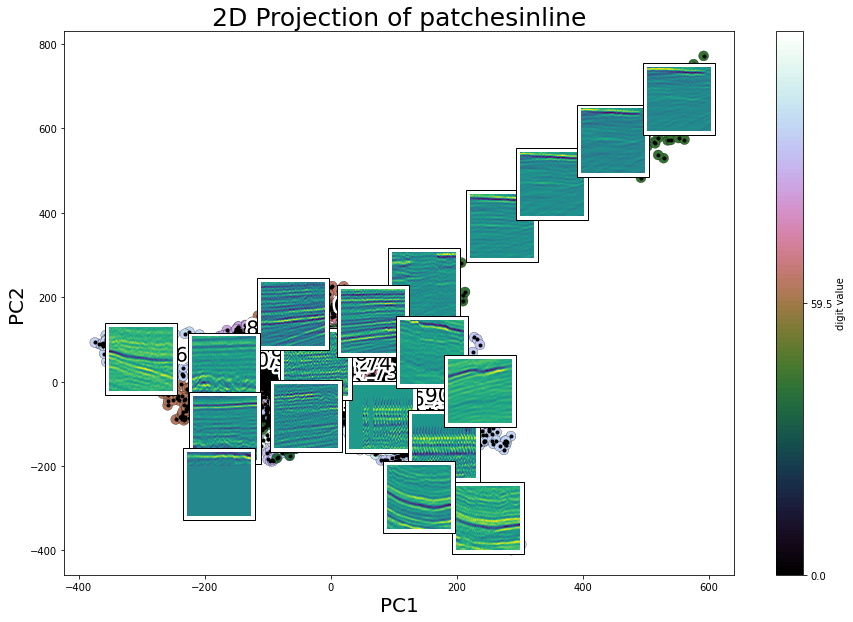

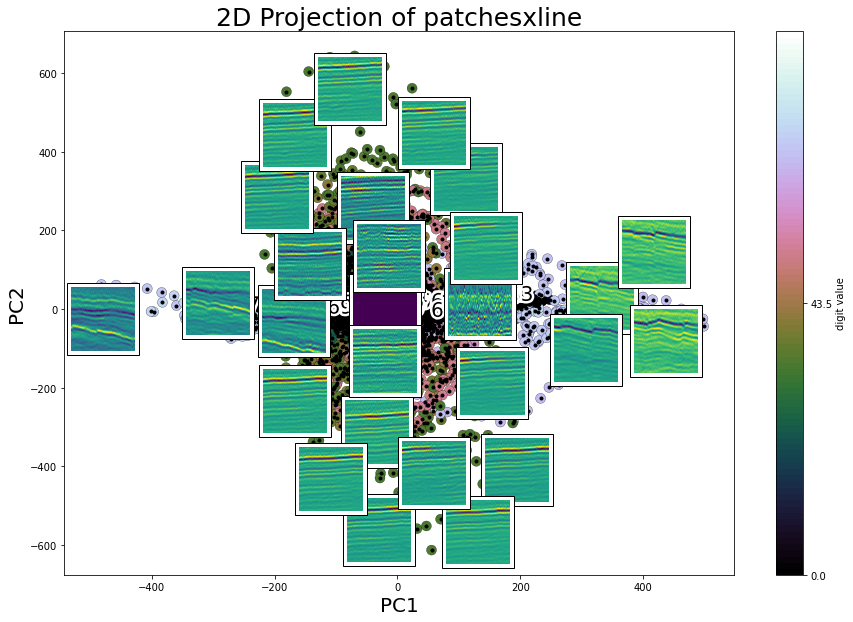

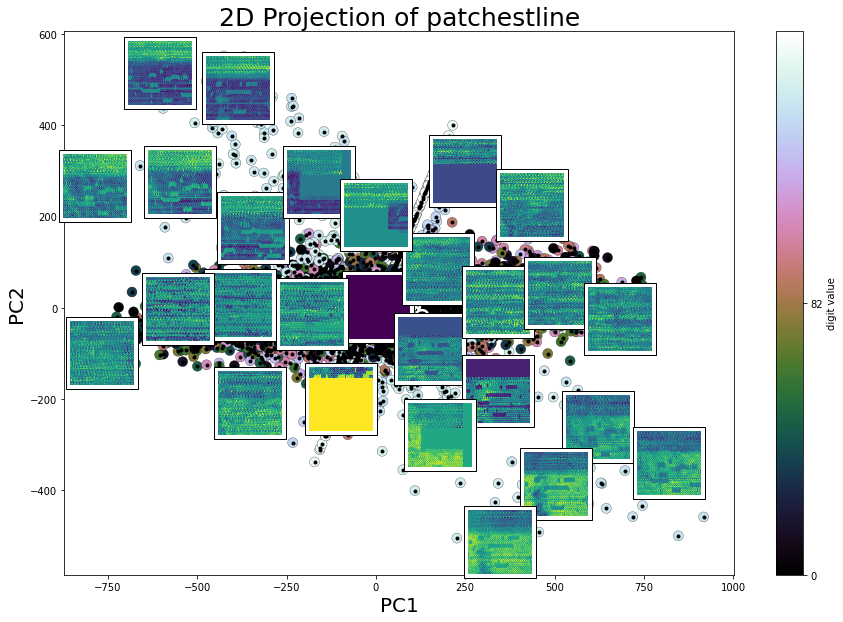

In [149]:

### plot pca of each direciton
for dir in directions:
    labels =patched_labels_per_image[dir]#patched_labels_per_grid_cell[dir]
    num_labels = int(np.max(labels))
    print("num_labelsss", num_labels, labels[-1])
    scatter(pca[dir], labels, num_labels, dir, show_labels=False) 
    
    

    # Plot acutal images on scatterplot
    print("Plottting: ", pca[dir])
    images = patched_data[dir]
    plot_components(proj=pca[dir],images=[np.reshape(i, (patch_size, patch_size)).T for i in images])

In [ ]:

### plot pca of each direciton
for dir in directions:
    labels =patched_labels_per_grid_cell[dir]
    num_labels = int(np.max(labels))
    print("num_labelsss", num_labels, labels[-1])
    scatter(pca[dir], labels, num_labels, dir, show_labels=True) 
    
    

    # Plot acutal images on scatterplot
    print("Plottting: ", pca[dir])
    images = patched_data[dir]
    plot_components(proj=pca[dir],images=[np.reshape(i, (patch_size, patch_size)).T for i in images])

pca[dir] (10000, 2)
pca[dir] (10000, 2)
pca[dir] (10000, 2)


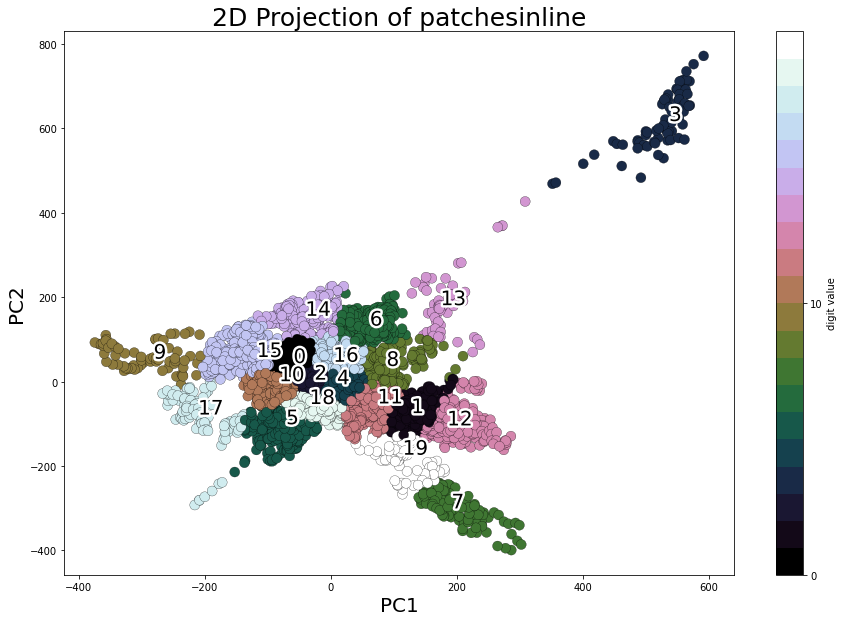

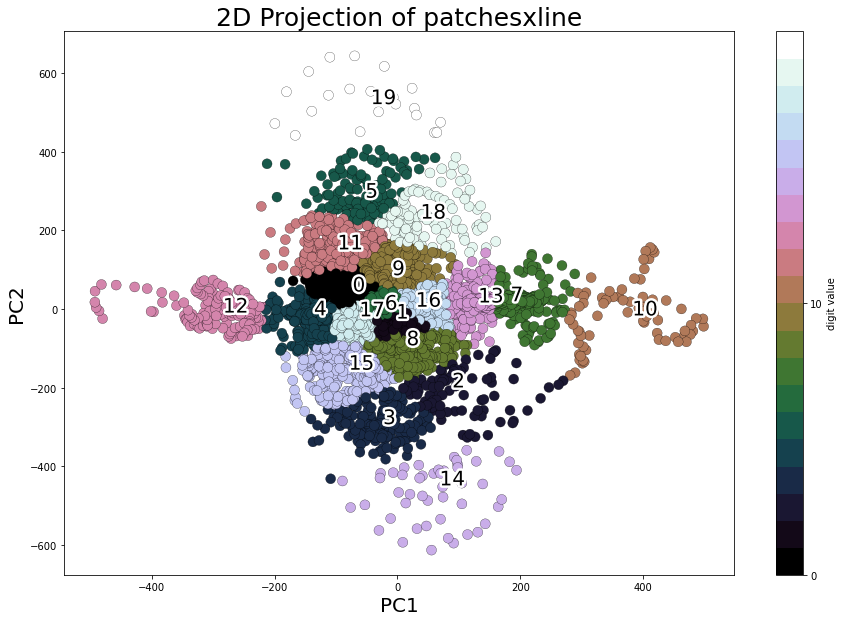

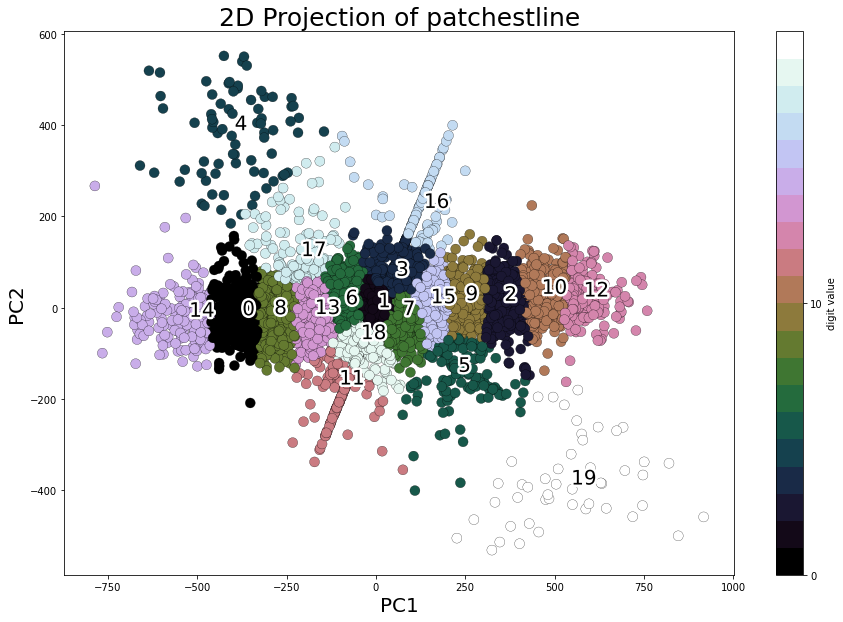

In [23]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 20


for dir in directions:
    print("pca[dir]", pca[dir].shape)
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(pca[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_

    
    # plot 
    scatter(pca[dir], labels_kmeans, n_clusters, dir, output=output_folder +"/pca_kmeans_"+dir+"_"+str(n_clusters)+".png", show_labels=True)

In [98]:
"""
When using pca to ptoject the data into 2D space, we see that 
every image is most similar to the next. This is evident in inline/xline, 
and is expected as we consider the directions to be continuous changing. The tline direction is a result 
of changes in bot iline and xline ansd is less linear. Among xline/inline
xline seem to have more distinc area in som e parts of the survye, and come reoccuring 
characterisitcts, indicated by the "lines" beeing almost as close to other indexes than the next in some parts of
the survey.

one could use this projection to estimate which slices is more similar by using eucledian distance 
from the projected points. 

TODO: TAKE A IMAGE AND FIND AND PLOT THE IMAGES THAT IS CLOSE TO SAID THAT SLICE BUT NOT CLOSE IN INDEX
"""

'\nWhen using pca to ptoject the data into 2D space, we see that \nevery image is most similar to the next. This is evident in inline/xline, \nand is expected as we consider the directions to be continuous changing. The tline direction is a result \nof changes in bot iline and xline ansd is less linear. Among xline/inline\nxline seem to have more distinc area in som e parts of the survye, and come reoccuring \ncharacterisitcts, indicated by the "lines" beeing almost as close to other indexes than the next in some parts of\nthe survey.\n\none could use this projection to estimate which slices is more similar by using eucledian distance \nfrom the projected points. \n\nTODO: TAKE A IMAGE AND FIND AND PLOT THE IMAGES THAT IS CLOSE TO SAID THAT SLICE BUT NOT CLOSE IN INDEX\n'

Plottting:  inline 64 PCA
Plottting:  inline 64 LLE
Plottting:  inline 64 Isomap
Plottting:  inline 64 UMAP


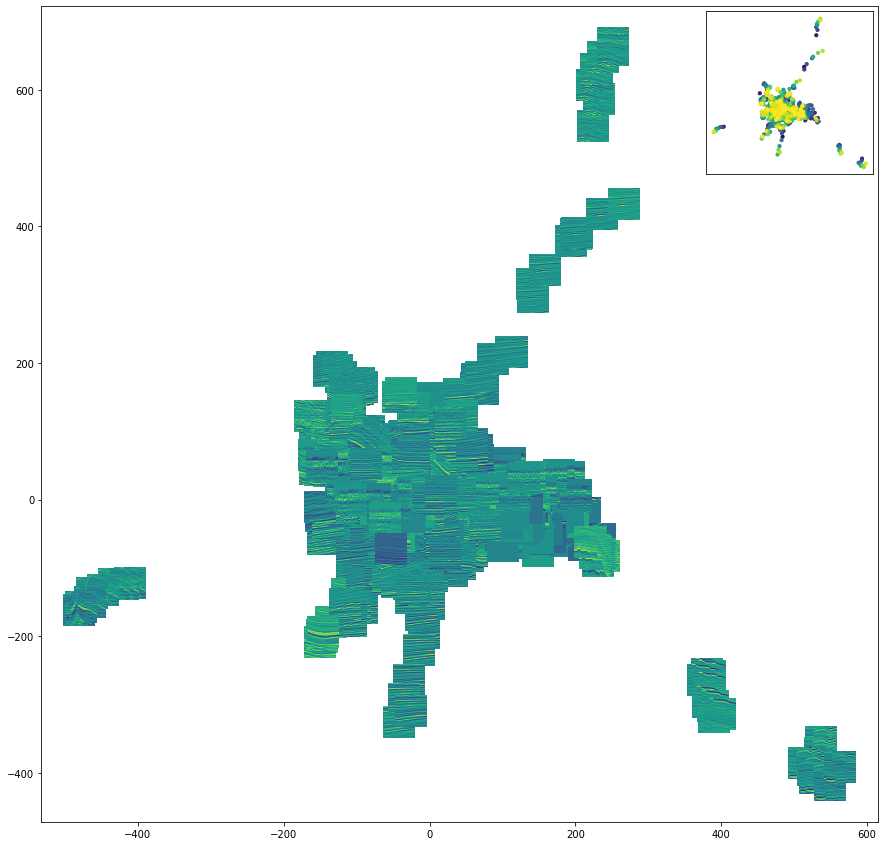

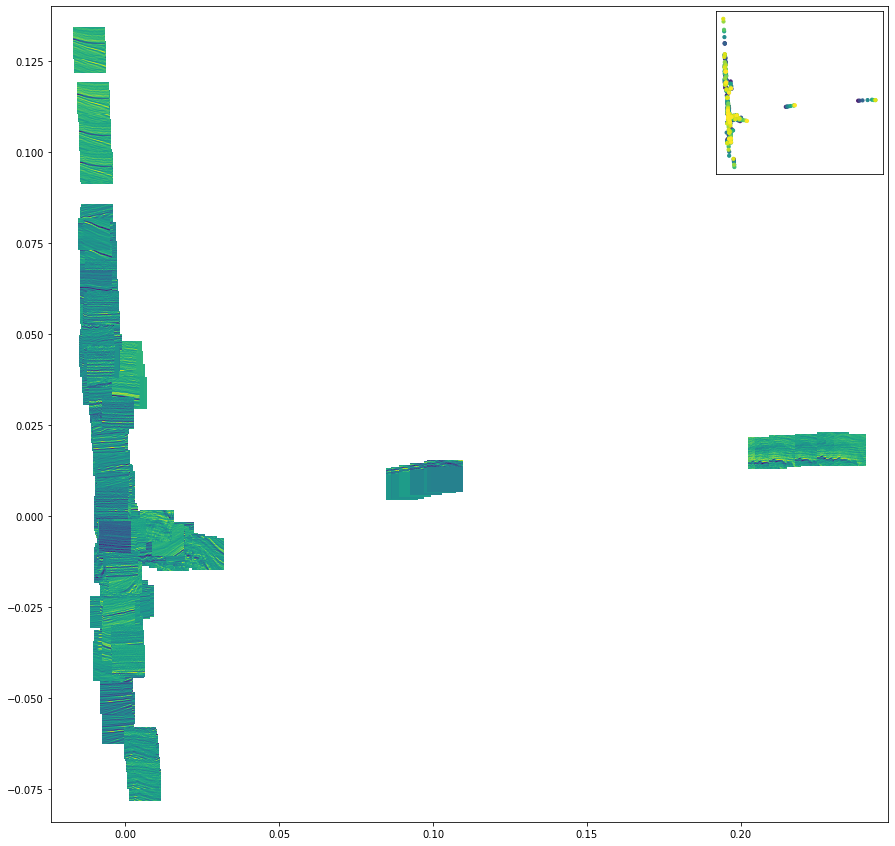

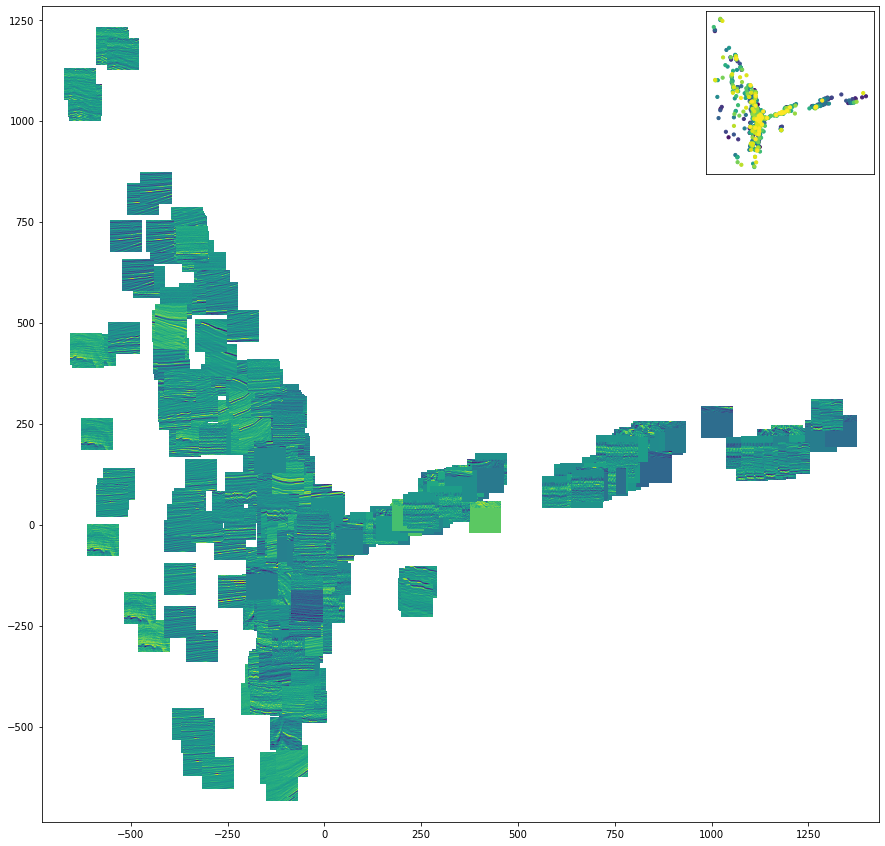

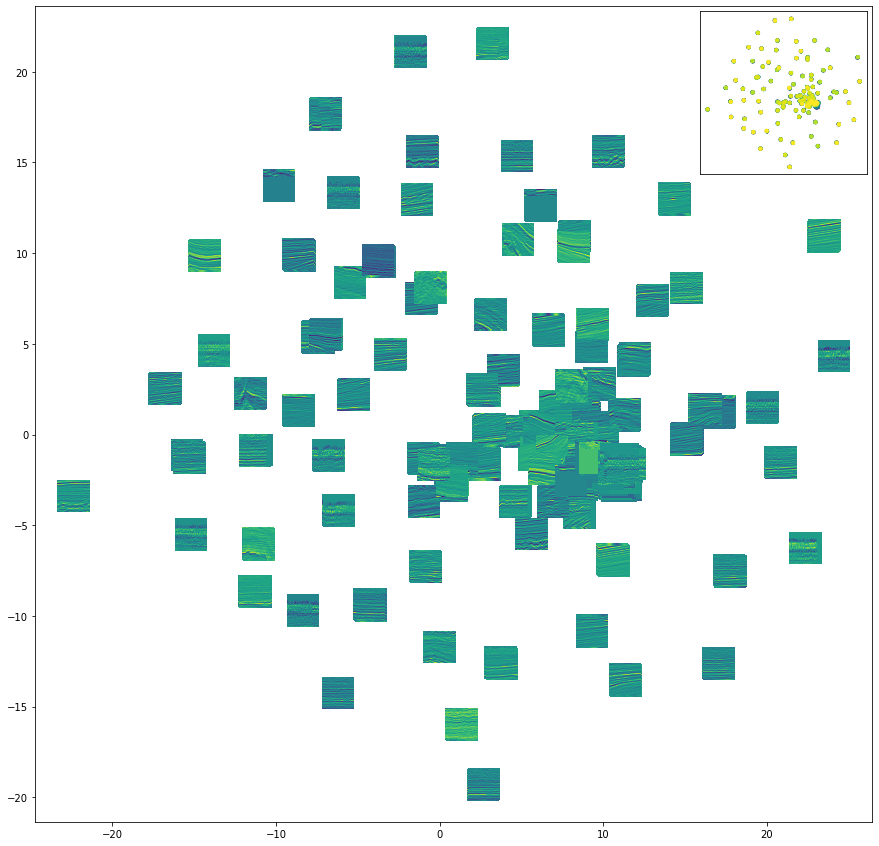

In [38]:
from mpl_toolkits.axes_grid1.inset_locator import zoomed_inset_axes
from matplotlib.offsetbox import OffsetImage, AnnotationBbox
from mpl_toolkits.axes_grid1.inset_locator import mark_inset
# visualise the scatterplot in actual images 
from mpl_toolkits.axes_grid.inset_locator import inset_axes
patch_sizes = [64]
lb = label_colors[0]
directions = ["inline"]
for dir in directions:
    for ps in patch_sizes:
        scale=0.5
        for (label, method) in methods.items():
            fig = plt.figure(figsize=(15, 15))
            ax = plt.subplot()
            print("Plottting: ", dir, ps,label )
            #images = patched_data_dir[ps][dir]
            images = patched_data[dir]

            plots = results[ps][dir][label]["data"][:int(n_points/2)-10]
            filename = output_folder + "/" + label +"_sliceplot_" + dir + "____"+str(ps) + ".png"
            #visualize_scatter_with_images(plots, images = [np.reshape(i, (ps, ps)) for i in images], image_zoom=0.50+scale,output=filename)
            images = [np.reshape(i, (ps, ps)) for i in images]
            image_zoom=0.5
            artists = []
            for xy, j in zip(plots, images):
                x0, y0 = xy
                img = OffsetImage(j, zoom=image_zoom)
                ab = AnnotationBbox(img, (x0, y0), xycoords='data', frameon=False)
                artists.append(ax.add_artist(ab))
            ax.update_datalim(plots)
            ax.autoscale()
            # this is an inset axes over the main axes
            ins_axes = inset_axes(ax, 
                                width="20%", # width = 30% of parent_bbox
                                height="20%", # height : 1 inch
                                loc=1)
            #plt.title('Probability')
            plt.xticks([])
            plt.yticks([])
            plt.scatter(plots[:, 0], plots[:, 1], s=10, c=lb[:int(n_points/2)-10],cmap=plt.cm.get_cmap('viridis', n_points))#,color="black")
            plt.savefig(filename)
        scale-=0.1
            
            
            
            

In [ ]:
### Dimension reduction and visualization with TSNE


In [10]:
from sklearn.metrics.pairwise import pairwise_distances
from sklearn.manifold import TSNE
from sklearn.manifold.t_sne import (_joint_probabilities,
                                    _kl_divergence)
# Random state we define this random state to use this value in TSNE which is a randmized algo.
RS = 25111993
T_SNE ={}
for dir in directions:
    # TODO REMOVE just for veriication 
    patched_data[dir] = patched_data[dir][0:1000]
    patched_labels[dir] = patched_labels[dir][0:1000]
    patched_labels_per_image[dir] = patched_labels_per_image[dir][0:1000]
    patched_labels_per_grid_cell[dir] = patched_labels_per_grid_cell[dir][0:1000]

    print(patched_labels[dir].shape)
    
    
    
    filename = output_folder + "/T_SNE_" + dir + ".npy"
    if not os.path.exists(filename):
        print("did not find data.. creating new...")
        T_SNE[dir] = TSNE(random_state=RS).fit_transform(patched_data[dir])
        # store the data 
        np.save(filename, T_SNE[dir])
    else:
        print("found data. loading it to memory")
        T_SNE[dir] = np.load(filename)
    

(1000,)
found data. loading it to memory
(1000,)
found data. loading it to memory
(1000,)
found data. loading it to memory


/usr/local/lib/python3.7/site-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.manifold.t_sne module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.manifold. Anything that cannot be imported from sklearn.manifold is now part of the private API.
  warnings.warn(message, FutureWarning)


In [12]:
# plot T-SNE 
for dir in directions: 
    labels =patched_labels_per_grid_cell[dir]
    num_labels = int(np.max(labels))
    print("num_labelsss", num_labels, labels[-1])
    scatter(T_SNE[dir], labels, num_labels, dir, show_labels=True)
    
    

num_labelsss 119 39.0
num_labelsss 87 31.0
num_labelsss 164 9.0


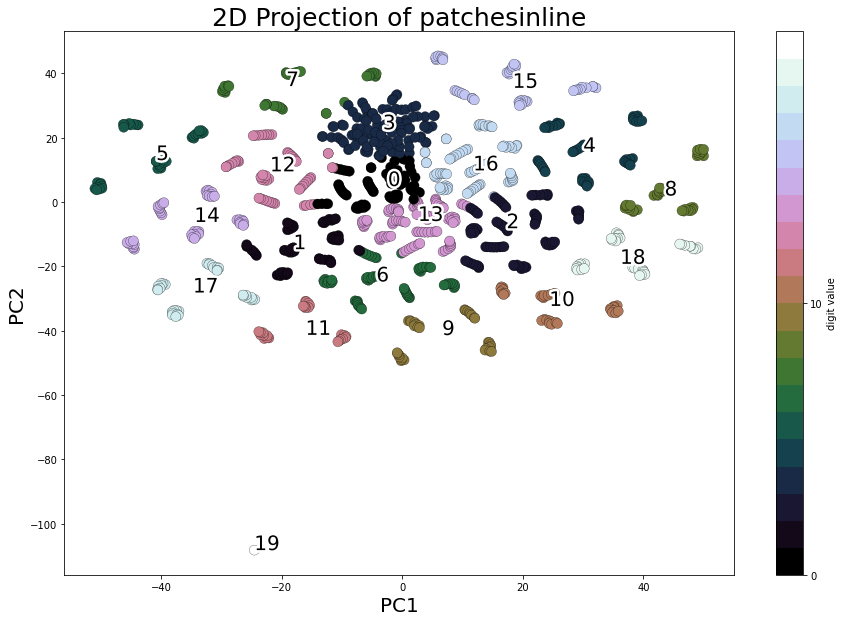

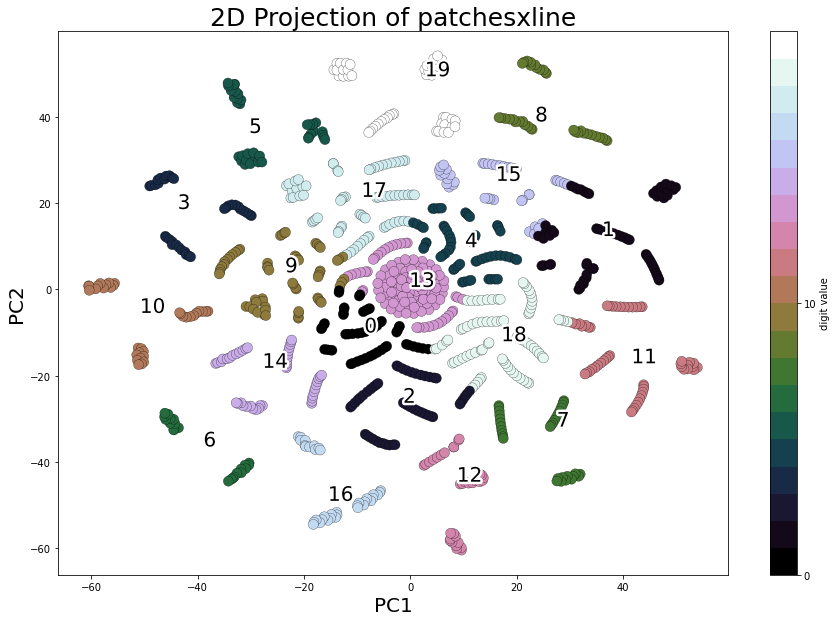

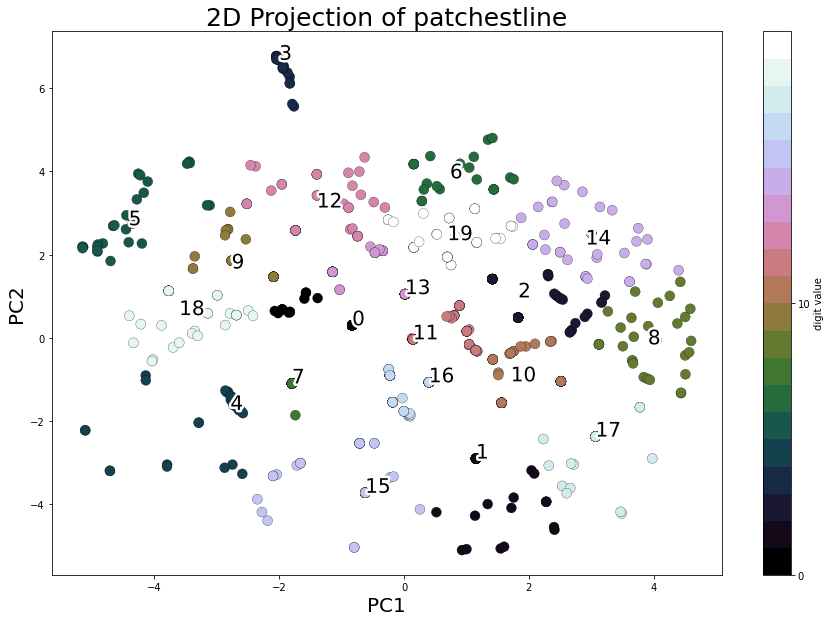

In [14]:
# perform k-means on each dir  to seperate into clusters?
n_clusters = 20

for dir in directions:
    k_means = KMeans(n_clusters, random_state=0)
    k_means.fit(T_SNE[dir])
    values = k_means.cluster_centers_.squeeze()
    labels_kmeans = k_means.labels_
    
    scatter(T_SNE[dir], labels_kmeans, n_clusters, dir, output=output_folder +"/TSNE_kmeans_"+dir+"_"+str(n_clusters)+".png", show_labels=True)

Plottting:  inline
Plottting:  xline
Plottting:  tline


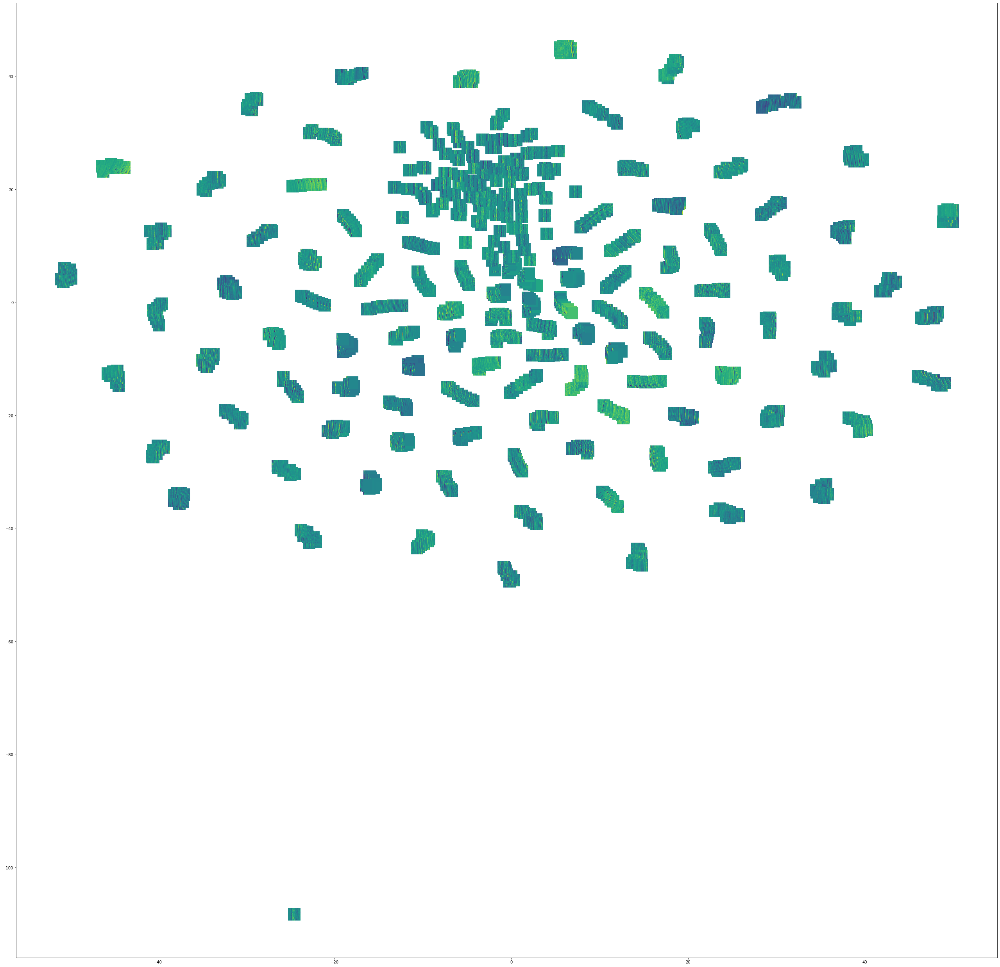

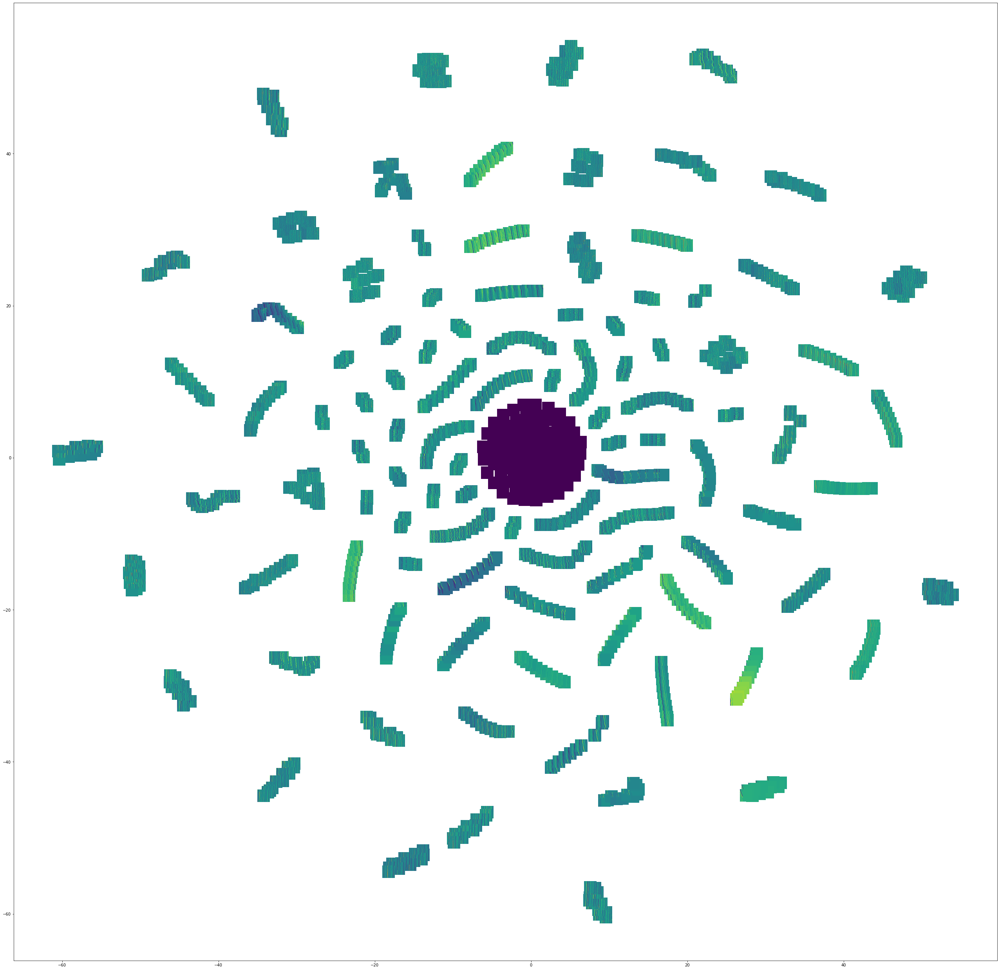

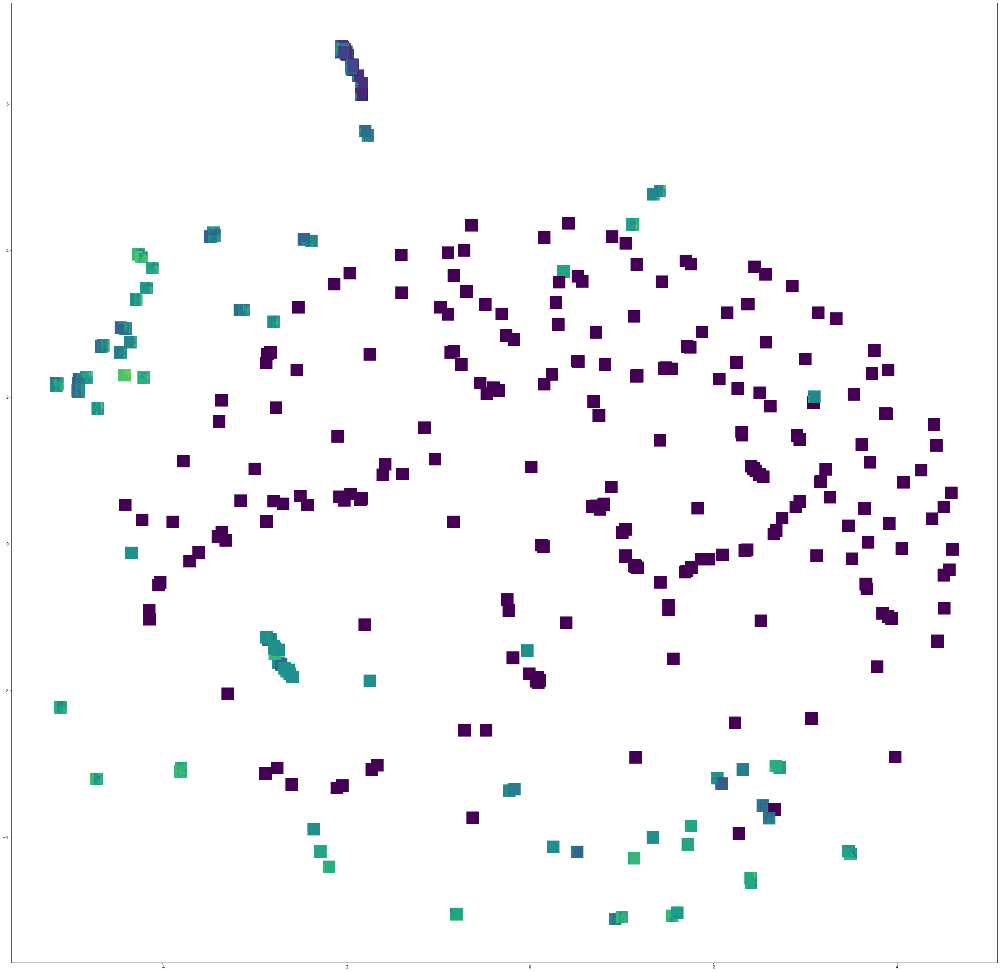

In [16]:
# visualise the scatterplot in actual images 

for dir in directions:
    print("Plottting: ", dir)
    images = patched_data[dir]
    plots = T_SNE[dir]
    filename = output_folder + "/TSNE_sliceplot_" + dir + ".png"
    visualize_scatter_with_images(plots, images = [np.reshape(i, (patch_size,patch_size)).T for i in images], image_zoom=0.5, output=filename)


In [ ]:
# wHAT WE SEE IS CLEAR CLUSTERS OF IDENTICAL PATCHES. 
# THIS MEANS THAT I CAN EASILY CLIKCCK OON ONE PATCH, 
# AND BY EASILY FINDING THE PATCHES CLOSE TO STHE SELECTED ONE IN T-SNE PROJECTED SPACE. 

# TODO ADD PATCH LABEL BOTH SLICE INDEX + SLICE RELATIVE LOCATION 

# TODO MAKE SMALL APP THAT CLICKS ON A INLINE PATCH AND GETS ALL SIMIALAR LOOKING PATCHES
# BUT THE IDENTICAL ONE WILL MOST LIKELY BE CLOSE IN DIRECTION, SO NEED TO PROVIDE A TRESHOLD SO ONE DOES NOT ONLY FIND
# THE ONES CLOSEST. 

In [ ]:
### TRY KNN AND OTHER CLUSTERING THAN KMEANS TO EXPLOIT EUCLEDIAN DISTANCE IN PROJECTION SPACE 
### use a clustering algorithm that infers number of clusters. Kmeans splits unintuitvily becouse of the num_clusters are foreced to apply

In [ ]:
## do this process for induvidual patches and not only actual images

In [ ]:
### 5TSNE WITH PCA
